In [2]:
!wget https://raw.githubusercontent.com/amueller/introduction_to_ml_with_python/master/preamble.py
!pip install mglearn

--2026-09-18 05:14:40--  https://raw.githubusercontent.com/amueller/introduction_to_ml_with_python/master/preamble.py
Resolving raw.githubusercontent.com (raw.githubusercontent.com)... 185.199.108.133, 185.199.109.133, 185.199.110.133, ...
Connecting to raw.githubusercontent.com (raw.githubusercontent.com)|185.199.108.133|:443... connected.
HTTP request sent, awaiting response... 200 OK
Length: 783 [text/plain]
Saving to: ‘preamble.py’

preamble.py         100%[===================>]     783  --.-KB/s    in 0s      

2026-09-18 05:14:40 (23.4 MB/s) - ‘preamble.py’ saved [783/783]

   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 581.4/581.4 kB 7.4 MB/s eta 0:00:00


Kode ini digunakan untuk menyiapkan lingkungan pembelajaran di Google Colab. Perintah `wget` mengambil file `preamble.py` yang berisi beberapa konfigurasi dan fungsi pendukung dari materi, sedangkan `pip install mglearn` memasang library `mglearn` yang digunakan untuk membuat visualisasi pada pembahasan machine learning.

In [3]:
%matplotlib inline
from preamble import *
plt.rcParams['image.cmap'] = "gray"

Kode ini mengaktifkan tampilan grafik Matplotlib secara langsung di notebook dan mengimpor isi dari `preamble.py`. Pengaturan `plt.rcParams['image.cmap'] = "gray"` membuat gambar yang ditampilkan menggunakan colormap abu-abu sebagai tampilan default.

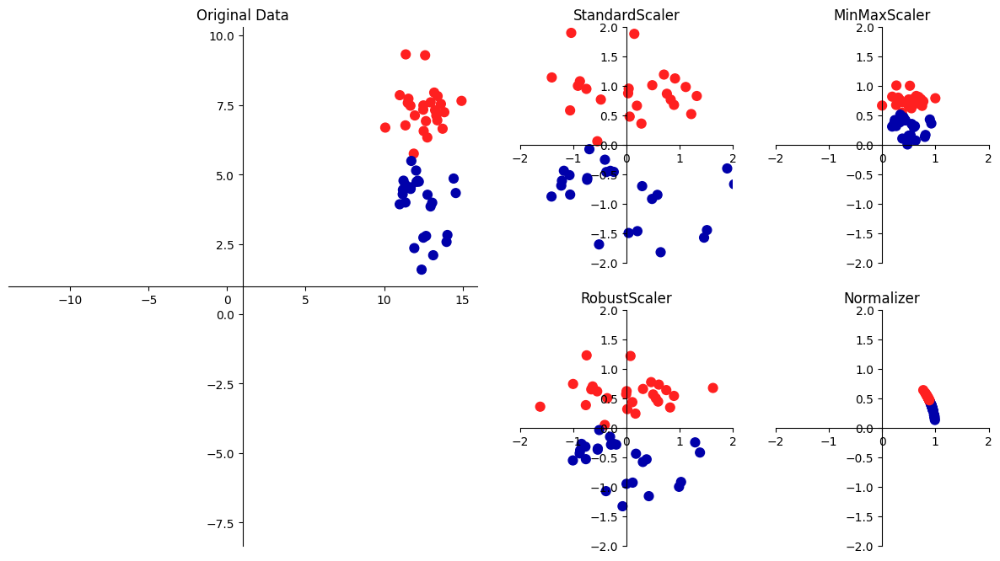

In [4]:
mglearn.plots.plot_scaling()

Kode ini menampilkan ilustrasi mengenai beberapa metode penskalaan data. Visualisasi tersebut digunakan untuk melihat perbedaan skala data sebelum dan sesudah dilakukan preprocessing, sehingga dapat dipahami mengapa scaling penting pada beberapa algoritma machine learning.

In [5]:
from sklearn.datasets import load_breast_cancer
from sklearn.model_selection import train_test_split
cancer = load_breast_cancer()

X_train, X_test, y_train, y_test = train_test_split(cancer.data, cancer.target,
                                                    random_state=1)
print(X_train.shape)
print(X_test.shape)

(426, 30)
(143, 30)


Kode ini memuat dataset Breast Cancer dari `scikit-learn`, kemudian membaginya menjadi data training dan data testing menggunakan `train_test_split`. Pembagian ini diperlukan agar model nantinya dapat dilatih menggunakan data training dan diuji menggunakan data yang tidak digunakan saat proses pelatihan. `shape` digunakan untuk melihat jumlah data dan fitur pada masing-masing bagian.

In [6]:
from sklearn.preprocessing import MinMaxScaler

scaler = MinMaxScaler()

Kode ini membuat objek `MinMaxScaler` yang akan digunakan untuk melakukan normalisasi data. Metode ini mengubah nilai setiap fitur ke rentang tertentu, pada kasus ini rentang 0 sampai 1.

In [7]:
scaler.fit(X_train)

MinMaxScaler()

Kode ini melakukan proses `fit` pada `X_train`. Pada tahap ini scaler mempelajari nilai minimum dan maksimum dari setiap fitur pada data training yang nantinya digunakan sebagai acuan ketika melakukan transformasi.

In [8]:
# transform data
X_train_scaled = scaler.transform(X_train)
# print dataset properties before and after scaling
print("transformed shape: {}".format(X_train_scaled.shape))
print("per-feature minimum before scaling:\n {}".format(X_train.min(axis=0)))
print("per-feature maximum before scaling:\n {}".format(X_train.max(axis=0)))
print("per-feature minimum after scaling:\n {}".format(
    X_train_scaled.min(axis=0)))
print("per-feature maximum after scaling:\n {}".format(
    X_train_scaled.max(axis=0)))

transformed shape: (426, 30)
per-feature minimum before scaling:
 [  6.981   9.71   43.79  143.5     0.053   0.019   0.      0.      0.106
   0.05    0.115   0.36    0.757   6.802   0.002   0.002   0.      0.
   0.01    0.001   7.93   12.02   50.41  185.2     0.071   0.027   0.
   0.      0.157   0.055]
per-feature maximum before scaling:
 [  28.11    39.28   188.5   2501.       0.163    0.287    0.427    0.201
    0.304    0.096    2.873    4.885   21.98   542.2      0.031    0.135
    0.396    0.053    0.061    0.03    36.04    49.54   251.2   4254.
    0.223    0.938    1.17     0.291    0.577    0.149]
per-feature minimum after scaling:
 [0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.
 0. 0. 0. 0. 0. 0.]
per-feature maximum after scaling:
 [1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1.
 1. 1. 1. 1. 1. 1.]


Kode ini mengubah data training menggunakan scaler yang sudah dipelajari. Setelah transformasi, kode menampilkan bentuk data serta nilai minimum dan maksimum setiap fitur sebelum dan sesudah scaling untuk menunjukkan perubahan skala data.

In [9]:
# transform test data
X_test_scaled = scaler.transform(X_test)
# print test data properties after scaling
print("per-feature minimum after scaling:\n{}".format(X_test_scaled.min(axis=0)))
print("per-feature maximum after scaling:\n{}".format(X_test_scaled.max(axis=0)))

per-feature minimum after scaling:
[ 0.034  0.023  0.031  0.011  0.141  0.044  0.     0.     0.154 -0.006
 -0.001  0.006  0.004  0.001  0.039  0.011  0.     0.    -0.032  0.007
  0.027  0.058  0.02   0.009  0.109  0.026  0.     0.    -0.    -0.002]
per-feature maximum after scaling:
[0.958 0.815 0.956 0.894 0.811 1.22  0.88  0.933 0.932 1.037 0.427 0.498
 0.441 0.284 0.487 0.739 0.767 0.629 1.337 0.391 0.896 0.793 0.849 0.745
 0.915 1.132 1.07  0.924 1.205 1.631]


Kode ini menerapkan scaler yang sama pada data testing. Data testing tidak boleh dibuatkan scaler baru karena parameter scaling harus berasal dari data training, sehingga preprocessing pada data testing tetap konsisten dengan data yang digunakan untuk melatih model.

/tmp/ipykernel_824/2404817811.py:9: UserWarning: *c* argument looks like a single numeric RGB or RGBA sequence, which should be avoided as value-mapping will have precedence in case its length matches with *x* & *y*.  Please use the *color* keyword-argument or provide a 2D array with a single row if you intend to specify the same RGB or RGBA value for all points.
  axes[0].scatter(X_train[:, 0], X_train[:, 1],
/tmp/ipykernel_824/2404817811.py:11: UserWarning: *c* argument looks like a single numeric RGB or RGBA sequence, which should be avoided as value-mapping will have precedence in case its length matches with *x* & *y*.  Please use the *color* keyword-argument or provide a 2D array with a single row if you intend to specify the same RGB or RGBA value for all points.
  axes[0].scatter(X_test[:, 0], X_test[:, 1], marker='^',
/tmp/ipykernel_824/2404817811.py:23: UserWarning: *c* argument looks like a single numeric RGB or RGBA sequence, which should be avoided as value-mapping will ha

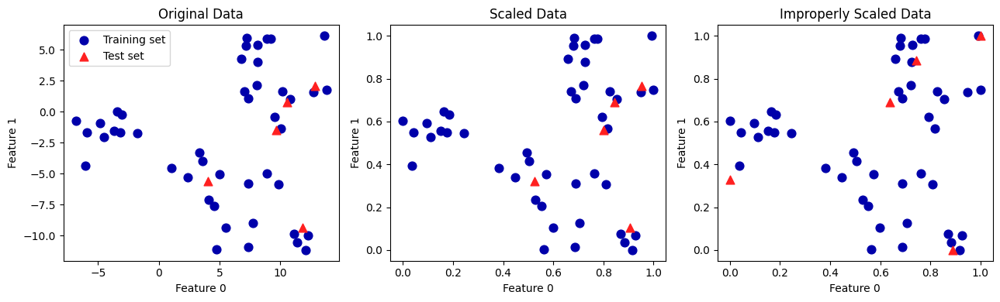

In [10]:
from sklearn.datasets import make_blobs
# make synthetic data
X, _ = make_blobs(n_samples=50, centers=5, random_state=4, cluster_std=2)
# split it into training and test sets
X_train, X_test = train_test_split(X, random_state=5, test_size=.1)

# plot the training and test sets
fig, axes = plt.subplots(1, 3, figsize=(13, 4))
axes[0].scatter(X_train[:, 0], X_train[:, 1],
                c=mglearn.cm2(0), label="Training set", s=60)
axes[0].scatter(X_test[:, 0], X_test[:, 1], marker='^',
                c=mglearn.cm2(1), label="Test set", s=60)
axes[0].legend(loc='upper left')
axes[0].set_title("Original Data")

# scale the data using MinMaxScaler
scaler = MinMaxScaler()
scaler.fit(X_train)
X_train_scaled = scaler.transform(X_train)
X_test_scaled = scaler.transform(X_test)

# visualize the properly scaled data
axes[1].scatter(X_train_scaled[:, 0], X_train_scaled[:, 1],
                c=mglearn.cm2(0), label="Training set", s=60)
axes[1].scatter(X_test_scaled[:, 0], X_test_scaled[:, 1], marker='^',
                c=mglearn.cm2(1), label="Test set", s=60)
axes[1].set_title("Scaled Data")

# rescale the test set separately
# so test set min is 0 and test set max is 1
# DO NOT DO THIS! For illustration purposes only.
test_scaler = MinMaxScaler()
test_scaler.fit(X_test)
X_test_scaled_badly = test_scaler.transform(X_test)

# visualize wrongly scaled data
axes[2].scatter(X_train_scaled[:, 0], X_train_scaled[:, 1],
                c=mglearn.cm2(0), label="training set", s=60)
axes[2].scatter(X_test_scaled_badly[:, 0], X_test_scaled_badly[:, 1],
                marker='^', c=mglearn.cm2(1), label="test set", s=60)
axes[2].set_title("Improperly Scaled Data")

for ax in axes:
    ax.set_xlabel("Feature 0")
    ax.set_ylabel("Feature 1")
fig.tight_layout()

Kode ini membuat data sintetis menggunakan `make_blobs`, kemudian membaginya menjadi training dan testing. Selanjutnya data divisualisasikan dalam tiga kondisi: data asli, data yang diskalakan dengan scaler dari training set, dan contoh data yang salah karena test set diskalakan menggunakan scaler-nya sendiri. Bagian terakhir menunjukkan mengapa test set tidak boleh melakukan scaling secara terpisah.

In [11]:
from sklearn.preprocessing import StandardScaler
scaler = StandardScaler()
# calling fit and transform in sequence (using method chaining)
X_scaled = scaler.fit(X_train).transform(X_train)
# same result, but more efficient computation
X_scaled_d = scaler.fit_transform(X_train)

Kode ini menggunakan `StandardScaler` untuk melakukan standardisasi data. `fit(X_train).transform(X_train)` melakukan proses pembelajaran parameter dan transformasi secara berurutan, sedangkan `fit_transform(X_train)` melakukan kedua proses tersebut sekaligus sehingga penulisannya lebih ringkas.

In [12]:
from sklearn.svm import SVC

X_train, X_test, y_train, y_test = train_test_split(cancer.data, cancer.target,
                                                    random_state=0)

svm = SVC(C=100)
svm.fit(X_train, y_train)
print("Test set accuracy: {:.2f}".format(svm.score(X_test, y_test)))

Test set accuracy: 0.94


Kode ini membuat model Support Vector Machine menggunakan `SVC` dengan parameter `C=100`. Model dilatih menggunakan data training Breast Cancer, kemudian performanya diuji menggunakan data testing melalui `score()` untuk mendapatkan nilai akurasi.

In [13]:
# preprocessing using 0-1 scaling
scaler = MinMaxScaler()
scaler.fit(X_train)
X_train_scaled = scaler.transform(X_train)
X_test_scaled = scaler.transform(X_test)

# learning an SVM on the scaled training data
svm.fit(X_train_scaled, y_train)

# scoring on the scaled test set
print("Scaled test set accuracy: {:.2f}".format(
    svm.score(X_test_scaled, y_test)))

Scaled test set accuracy: 0.97


Kode ini menerapkan preprocessing Min-Max Scaling pada data training dan testing sebelum digunakan oleh SVM. Setelah data berada pada skala 0 sampai 1, model SVM dilatih kembali dan akurasinya dihitung pada data testing yang telah diproses dengan scaler yang sama.

In [14]:
# preprocessing using zero mean and unit variance scaling
from sklearn.preprocessing import StandardScaler
scaler = StandardScaler()
scaler.fit(X_train)
X_train_scaled = scaler.transform(X_train)
X_test_scaled = scaler.transform(X_test)

# learning an SVM on the scaled training data
svm.fit(X_train_scaled, y_train)

# scoring on the scaled test set
print("SVM test accuracy: {:.2f}".format(svm.score(X_test_scaled, y_test)))

SVM test accuracy: 0.96


Kode ini menggunakan `StandardScaler` untuk membuat data memiliki rata-rata mendekati 0 dan standar deviasi 1. Data hasil standardisasi kemudian digunakan untuk melatih SVM dan menghitung akurasi pada data testing.

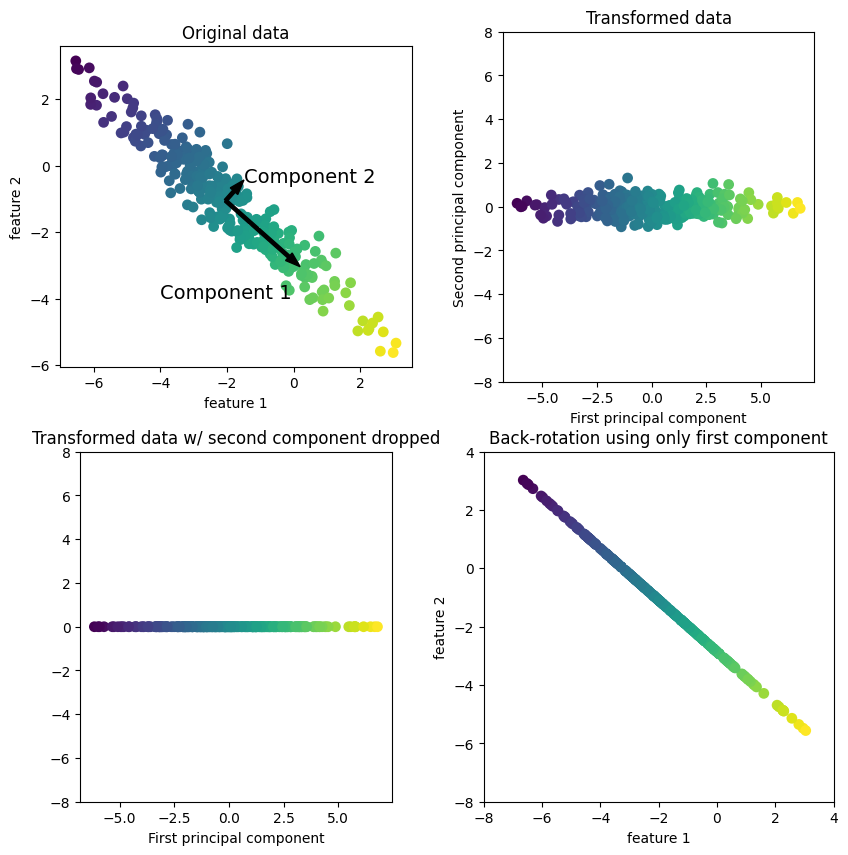

In [15]:
mglearn.plots.plot_pca_illustration()

Kode ini menampilkan ilustrasi konsep Principal Component Analysis (PCA). Visualisasi digunakan untuk membantu memahami bagaimana data dengan banyak dimensi dapat diproyeksikan ke beberapa komponen utama yang tetap mempertahankan informasi penting sebanyak mungkin.

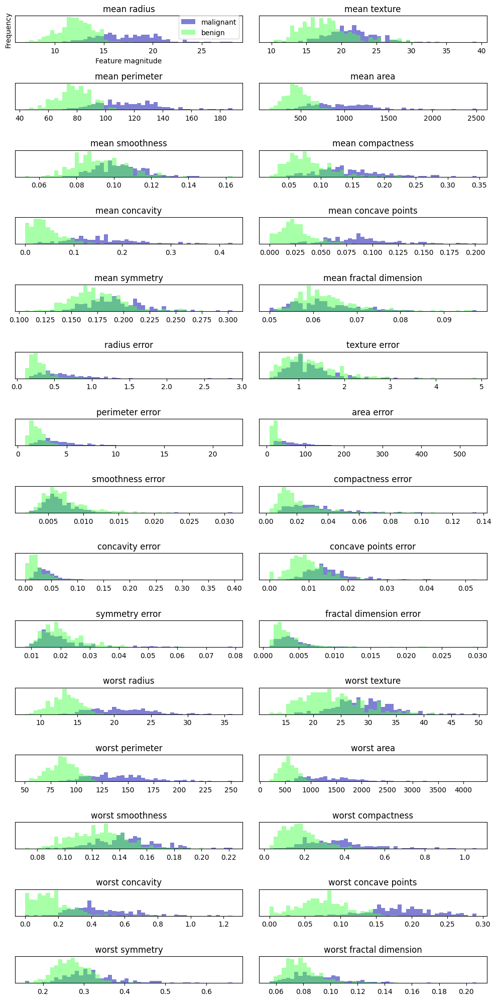

In [16]:
fig, axes = plt.subplots(15, 2, figsize=(10, 20))
malignant = cancer.data[cancer.target == 0]
benign = cancer.data[cancer.target == 1]

ax = axes.ravel()

for i in range(30):
    _, bins = np.histogram(cancer.data[:, i], bins=50)
    ax[i].hist(malignant[:, i], bins=bins, color=mglearn.cm3(0), alpha=.5)
    ax[i].hist(benign[:, i], bins=bins, color=mglearn.cm3(2), alpha=.5)
    ax[i].set_title(cancer.feature_names[i])
    ax[i].set_yticks(())
ax[0].set_xlabel("Feature magnitude")
ax[0].set_ylabel("Frequency")
ax[0].legend(["malignant", "benign"], loc="best")
fig.tight_layout()

Kode ini membuat histogram untuk 30 fitur pada dataset Breast Cancer dan membandingkan distribusinya antara kelas malignant dan benign. Visualisasi ini membantu melihat perbedaan pola nilai fitur antar kelas serta menunjukkan bahwa setiap fitur dapat memiliki rentang nilai yang berbeda.

In [17]:
from sklearn.datasets import load_breast_cancer
cancer = load_breast_cancer()

scaler = StandardScaler()
scaler.fit(cancer.data)
X_scaled = scaler.transform(cancer.data)

Kode ini memuat kembali dataset Breast Cancer dan melakukan standardisasi seluruh fitur menggunakan `StandardScaler`. Hasilnya disimpan pada `X_scaled`, yang kemudian digunakan sebagai data input untuk proses PCA.

In [18]:
from sklearn.decomposition import PCA
# keep the first two principal components of the data
pca = PCA(n_components=2)
# fit PCA model to beast cancer data
pca.fit(X_scaled)

# transform data onto the first two principal components
X_pca = pca.transform(X_scaled)
print("Original shape: {}".format(str(X_scaled.shape)))
print("Reduced shape: {}".format(str(X_pca.shape)))

Original shape: (569, 30)
Reduced shape: (569, 2)


Kode ini membuat PCA dengan dua komponen utama. PCA dilatih menggunakan data yang sudah distandardisasi, kemudian data ditransformasikan dari banyak fitur menjadi dua fitur utama. Nilai `Original shape` dan `Reduced shape` menunjukkan perubahan jumlah dimensi sebelum dan sesudah reduksi.

Text(0, 0.5, 'Second principal component')

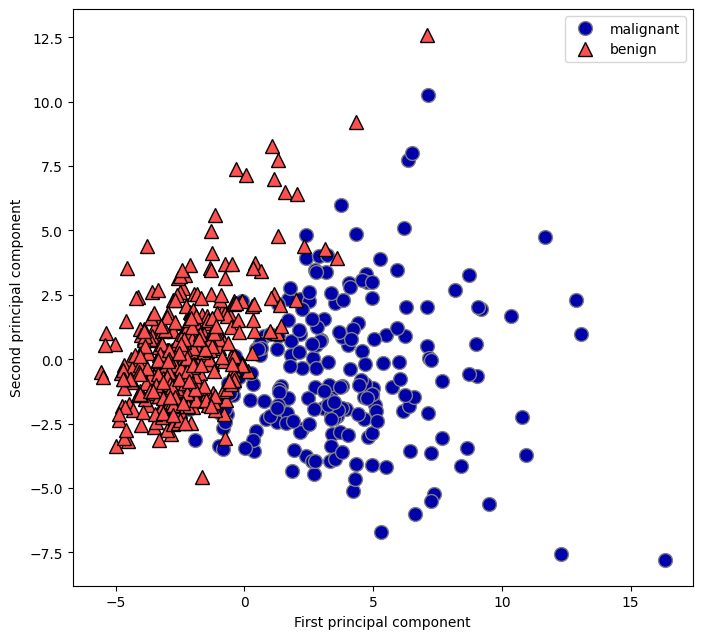

In [19]:
# plot first vs. second principal component, colored by class
plt.figure(figsize=(8, 8))
mglearn.discrete_scatter(X_pca[:, 0], X_pca[:, 1], cancer.target)
plt.legend(cancer.target_names, loc="best")
plt.gca().set_aspect("equal")
plt.xlabel("First principal component")
plt.ylabel("Second principal component")

Kode ini memvisualisasikan dua komponen utama hasil PCA dalam bentuk scatter plot. Setiap titik diberi warna berdasarkan kelas pada dataset sehingga dapat dilihat apakah dua komponen utama mampu memisahkan kedua kelas secara visual.

In [20]:
print("PCA component shape: {}".format(pca.components_.shape))

PCA component shape: (2, 30)


Kode ini menampilkan bentuk matriks `pca.components_`. Bentuk tersebut menunjukkan jumlah komponen utama yang dibuat dan jumlah fitur asli yang digunakan untuk membentuk setiap komponen.

In [21]:
print("PCA components:\n{}".format(pca.components_))

PCA components:
[[ 0.219  0.104  0.228  0.221  0.143  0.239  0.258  0.261  0.138  0.064
   0.206  0.017  0.211  0.203  0.015  0.17   0.154  0.183  0.042  0.103
   0.228  0.104  0.237  0.225  0.128  0.21   0.229  0.251  0.123  0.132]
 [-0.234 -0.06  -0.215 -0.231  0.186  0.152  0.06  -0.035  0.19   0.367
  -0.106  0.09  -0.089 -0.152  0.204  0.233  0.197  0.13   0.184  0.28
  -0.22  -0.045 -0.2   -0.219  0.172  0.144  0.098 -0.008  0.142  0.275]]


Kode ini menampilkan nilai dari `pca.components_`. Nilai tersebut merupakan bobot setiap fitur dalam pembentukan masing-masing principal component, sehingga dapat digunakan untuk melihat kontribusi relatif fitur terhadap komponen utama.

Text(0, 0.5, 'Principal components')

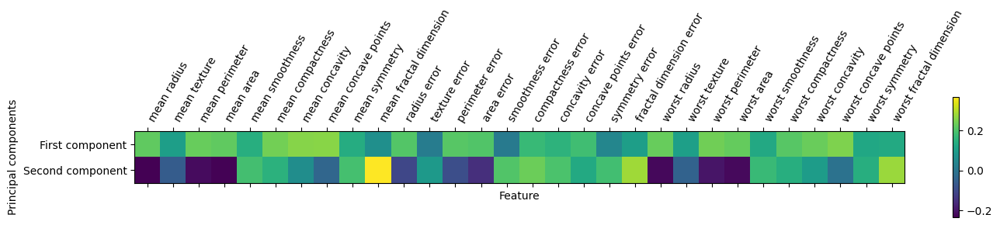

In [22]:
plt.matshow(pca.components_, cmap='viridis')
plt.yticks([0, 1], ["First component", "Second component"])
plt.colorbar()
plt.xticks(range(len(cancer.feature_names)),
           cancer.feature_names, rotation=60, ha='left')
plt.xlabel("Feature")
plt.ylabel("Principal components")

Kode ini memvisualisasikan bobot PCA dalam bentuk matriks warna. Setiap baris mewakili principal component, sedangkan setiap kolom mewakili fitur asli, sehingga pola kontribusi fitur terhadap komponen dapat lebih mudah diamati.

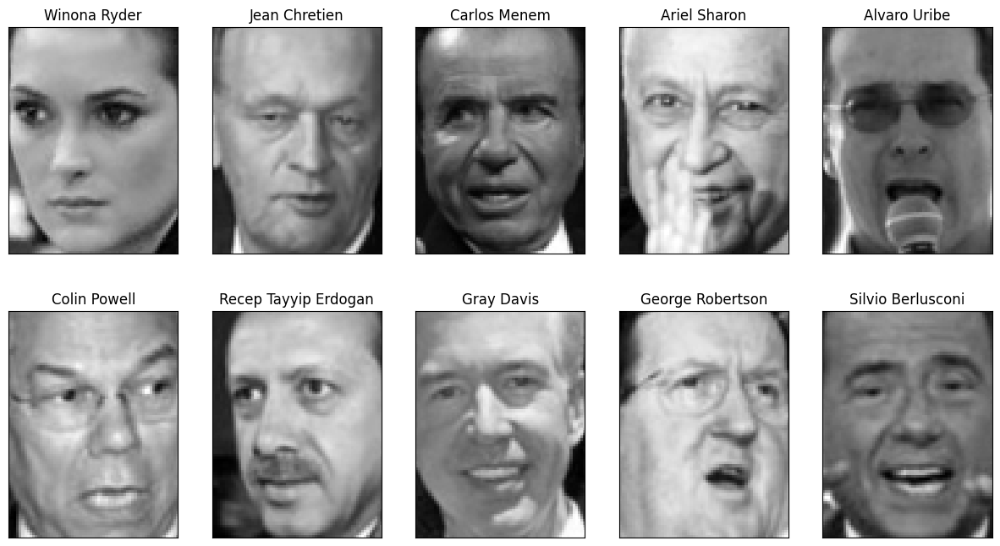

In [23]:
from sklearn.datasets import fetch_lfw_people
people = fetch_lfw_people(min_faces_per_person=20, resize=0.7)
image_shape = people.images[0].shape

fig, axes = plt.subplots(2, 5, figsize=(15, 8),
                         subplot_kw={'xticks': (), 'yticks': ()})
for target, image, ax in zip(people.target, people.images, axes.ravel()):
    ax.imshow(image)
    ax.set_title(people.target_names[target])

Kode ini memuat dataset Labeled Faces in the Wild (LFW) yang berisi gambar wajah dan memilih orang yang memiliki minimal 20 gambar. Beberapa gambar kemudian ditampilkan untuk melihat bentuk data dan nama kelas yang tersedia.

In [24]:
print("people.images.shape: {}".format(people.images.shape))
print("Number of classes: {}".format(len(people.target_names)))

people.images.shape: (3023, 87, 65)
Number of classes: 62


Kode ini menampilkan ukuran array gambar LFW dan jumlah kelas yang terdapat pada dataset. Informasi tersebut digunakan untuk mengetahui jumlah gambar, ukuran setiap gambar, dan banyaknya identitas yang akan diproses.

In [25]:
# count how often each target appears
counts = np.bincount(people.target)
# print counts next to target names:
for i, (count, name) in enumerate(zip(counts, people.target_names)):
    print("{0:25} {1:3}".format(name, count), end='   ')
    if (i + 1) % 3 == 0:
        print()

Alejandro Toledo           39   Alvaro Uribe               35   Amelie Mauresmo            21   
Andre Agassi               36   Angelina Jolie             20   Ariel Sharon               77   
Arnold Schwarzenegger      42   Atal Bihari Vajpayee       24   Bill Clinton               29   
Carlos Menem               21   Colin Powell              236   David Beckham              31   
Donald Rumsfeld           121   George Robertson           22   George W Bush             530   
Gerhard Schroeder         109   Gloria Macapagal Arroyo    44   Gray Davis                 26   
Guillermo Coria            30   Hamid Karzai               22   Hans Blix                  39   
Hugo Chavez                71   Igor Ivanov                20   Jack Straw                 28   
Jacques Chirac             52   Jean Chretien              55   Jennifer Aniston           21   
Jennifer Capriati          42   Jennifer Lopez             21   Jeremy Greenstock          24   
Jiang Zemin                20 

Kode ini menghitung jumlah kemunculan setiap target atau identitas menggunakan `np.bincount`. Hasilnya kemudian ditampilkan bersama nama orang sehingga distribusi jumlah gambar untuk setiap kelas dapat diketahui.

In [26]:
mask = np.zeros(people.target.shape, dtype=np.bool)
for target in np.unique(people.target):
    mask[np.where(people.target == target)[0][:50]] = 1

X_people = people.data[mask]
y_people = people.target[mask]

# scale the grey-scale values to be between 0 and 1
# instead of 0 and 255 for better numeric stability:
X_people = X_people / 255.

Kode ini membuat mask untuk mengambil maksimal 50 gambar dari setiap kelas. Data gambar kemudian dipilih menggunakan mask tersebut dan nilai grayscale dibagi 255 agar berada pada rentang 0 sampai 1, sehingga nilai input menjadi lebih stabil untuk proses berikutnya.

In [27]:
from sklearn.neighbors import KNeighborsClassifier
# split the data in training and test set
X_train, X_test, y_train, y_test = train_test_split(
    X_people, y_people, stratify=y_people, random_state=0)
# build a KNeighborsClassifier with using one neighbor:
knn = KNeighborsClassifier(n_neighbors=1)
knn.fit(X_train, y_train)
print("Test set score of 1-nn: {:.2f}".format(knn.score(X_test, y_test)))

Test set score of 1-nn: 0.22


Kode ini membagi data wajah menjadi training dan testing dengan `stratify` agar proporsi kelas tetap terjaga. Selanjutnya dibuat model K-Nearest Neighbors dengan satu tetangga dan model dilatih serta diuji untuk memperoleh skor pada data testing.

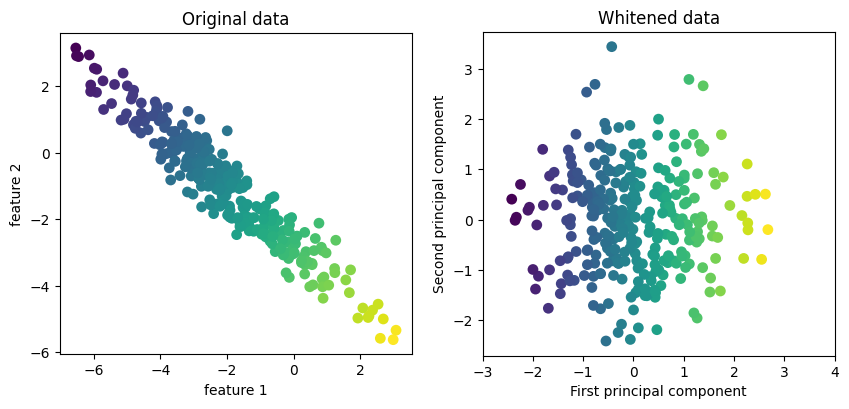

In [28]:
mglearn.plots.plot_pca_whitening()

Kode ini menampilkan ilustrasi konsep PCA whitening. Whitening merupakan proses yang dapat membuat komponen hasil PCA memiliki skala yang lebih seragam setelah reduksi dimensi, sehingga dapat membantu beberapa algoritma yang sensitif terhadap skala fitur.

In [29]:
pca = PCA(n_components=100, whiten=True, random_state=0).fit(X_train)
X_train_pca = pca.transform(X_train)
X_test_pca = pca.transform(X_test)

print("X_train_pca.shape: {}".format(X_train_pca.shape))

X_train_pca.shape: (1547, 100)


Kode ini menerapkan PCA dengan 100 komponen dan `whiten=True` pada data wajah. Data training dan testing kemudian ditransformasikan ke ruang PCA, sehingga jumlah fitur berkurang dan hasilnya disimpan dalam `X_train_pca` dan `X_test_pca`.

In [30]:
knn = KNeighborsClassifier(n_neighbors=1)
knn.fit(X_train_pca, y_train)
print("Test set accuracy: {:.2f}".format(knn.score(X_test_pca, y_test)))

Test set accuracy: 0.30


Kode ini kembali menggunakan K-Nearest Neighbors setelah data direduksi menggunakan PCA. Model dilatih pada data PCA dan akurasinya dihitung pada data testing yang sudah ditransformasikan dengan PCA yang sama.

In [31]:
print("pca.components_.shape: {}".format(pca.components_.shape))

pca.components_.shape: (100, 5655)


Kode ini menampilkan bentuk matriks komponen PCA. Informasi tersebut menunjukkan berapa banyak komponen yang digunakan dan berapa banyak nilai fitur yang membentuk setiap komponen.

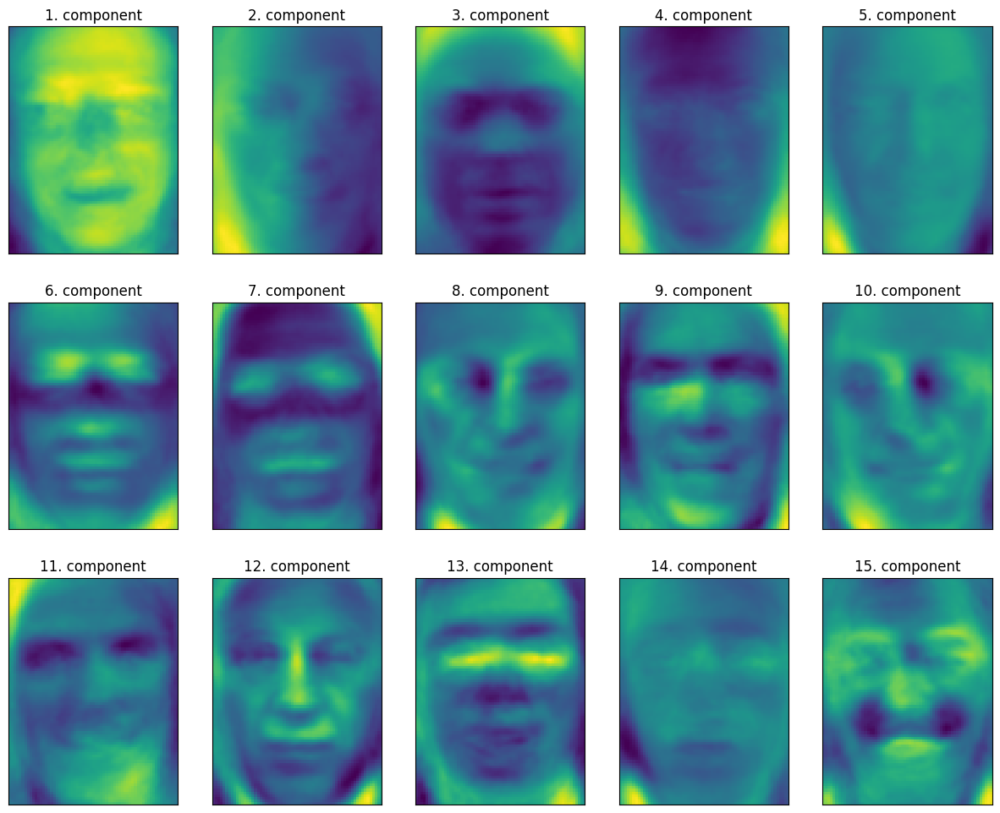

In [32]:
fig, axes = plt.subplots(3, 5, figsize=(15, 12),
                         subplot_kw={'xticks': (), 'yticks': ()})
for i, (component, ax) in enumerate(zip(pca.components_, axes.ravel())):
    ax.imshow(component.reshape(image_shape),
              cmap='viridis')
    ax.set_title("{}. component".format((i + 1)))

Kode ini menampilkan beberapa komponen PCA dalam bentuk gambar. Setiap komponen diubah kembali ke bentuk ukuran gambar sehingga pola visual yang dipelajari PCA dari kumpulan wajah dapat diamati.

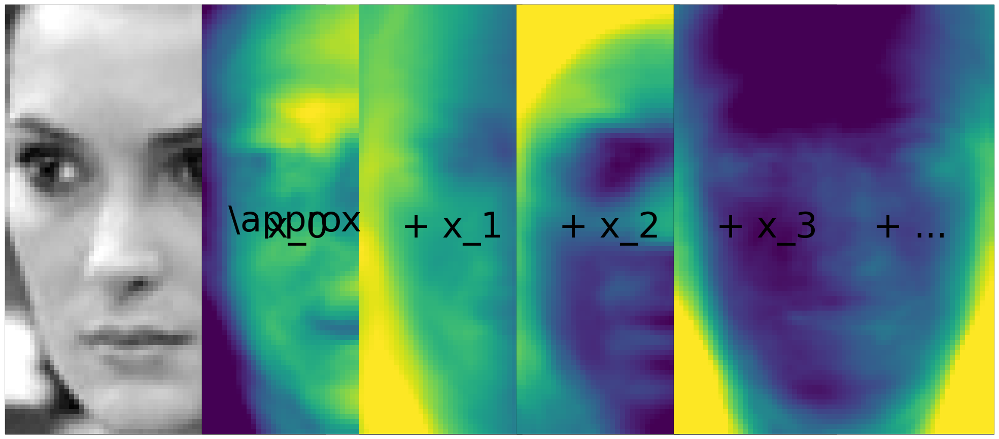

In [35]:
# FIXME hide this!
from matplotlib.offsetbox import AnnotationBbox, OffsetImage
import matplotlib.pyplot as plt
import numpy as np

image_shape = people.images[0].shape
plt.figure(figsize=(20, 3))
ax = plt.gca()

imagebox = OffsetImage(people.images[0], zoom=7, cmap="gray")
ab = AnnotationBbox(imagebox, (.05, 0.4), pad=0.0, xycoords='data')
ax.add_artist(ab)

for i in range(4):
    imagebox = OffsetImage(pca.components_[i].reshape(image_shape), zoom=7,
                           cmap="viridis")

    ab = AnnotationBbox(imagebox, (.3 + .2 * i, 0.4),
                        pad=0.0,
                        xycoords='data'
                        )
    ax.add_artist(ab)
    if i == 0:
        plt.text(.18, .25, 'x_{}'.format(i), fontdict={'fontsize': 50})
    else:
        plt.text(.15 + .2 * i, .25, '+ x_{}'.format(i),
                 fontdict={'fontsize': 50})

plt.text(.95, .25, '+ ...', fontdict={'fontsize': 50})

plt.text(.13, .3, r'\approx', fontdict={'fontsize': 50})
plt.axis("off")

plt.show()

Kode ini membuat visualisasi sederhana untuk menunjukkan bagaimana sebuah gambar dapat direpresentasikan sebagai kombinasi beberapa komponen PCA. Gambar asli dibandingkan dengan beberapa komponen utama untuk menggambarkan konsep rekonstruksi menggunakan kombinasi komponen.

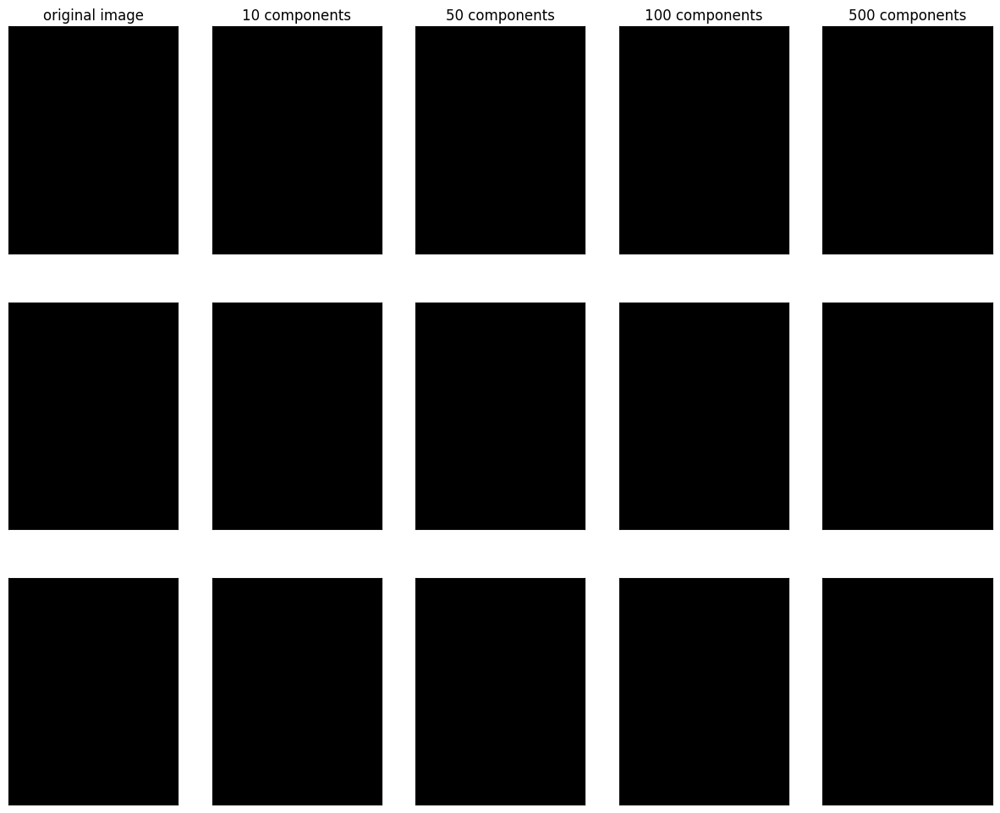

In [36]:
mglearn.plots.plot_pca_faces(X_train, X_test, image_shape)

Kode ini menggunakan fungsi `plot_pca_faces` dari `mglearn` untuk memvisualisasikan hasil PCA pada data wajah. Visualisasi membantu melihat hubungan antara gambar asli, komponen PCA, dan representasi wajah dalam ruang berdimensi lebih rendah.

Text(0, 0.5, 'Second principal component')

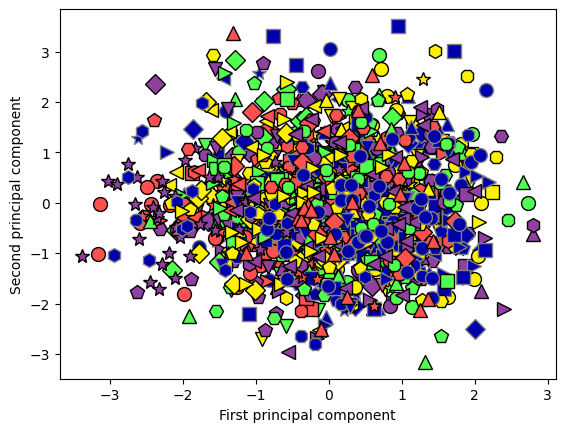

In [37]:
mglearn.discrete_scatter(X_train_pca[:, 0], X_train_pca[:, 1], y_train)
plt.xlabel("First principal component")
plt.ylabel("Second principal component")

Kode ini membuat scatter plot berdasarkan dua komponen PCA pertama dari data wajah. Warna atau kelompok titik berasal dari label kelas sehingga dapat diamati apakah representasi PCA membantu memisahkan identitas wajah secara visual.

/usr/local/lib/python3.13/dist-packages/sklearn/decomposition/_nmf.py:1742: ConvergenceWarning: Maximum number of iterations 200 reached. Increase it to improve convergence.
  warnings.warn(


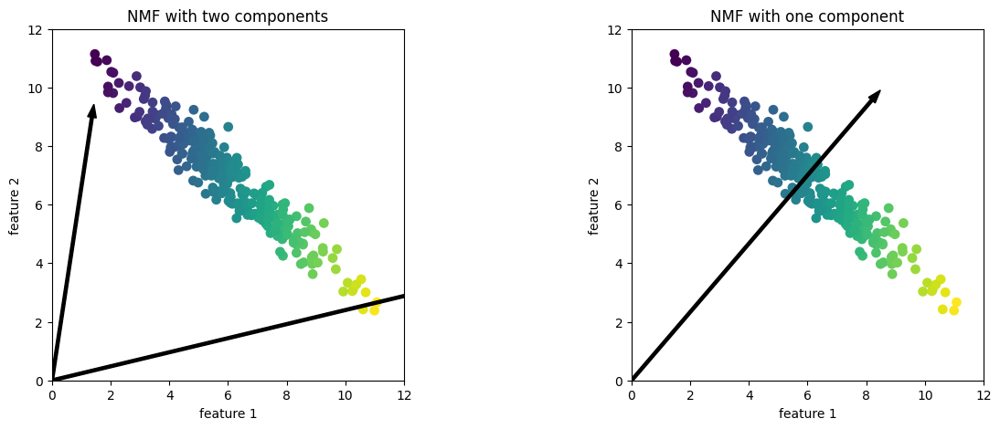

In [38]:
mglearn.plots.plot_nmf_illustration()

Kode ini menampilkan ilustrasi konsep Non-negative Matrix Factorization (NMF). NMF digunakan untuk memecah data menjadi beberapa komponen yang semuanya bernilai non-negatif, sehingga sering menghasilkan bagian-bagian atau pola yang lebih mudah diinterpretasikan pada data gambar.

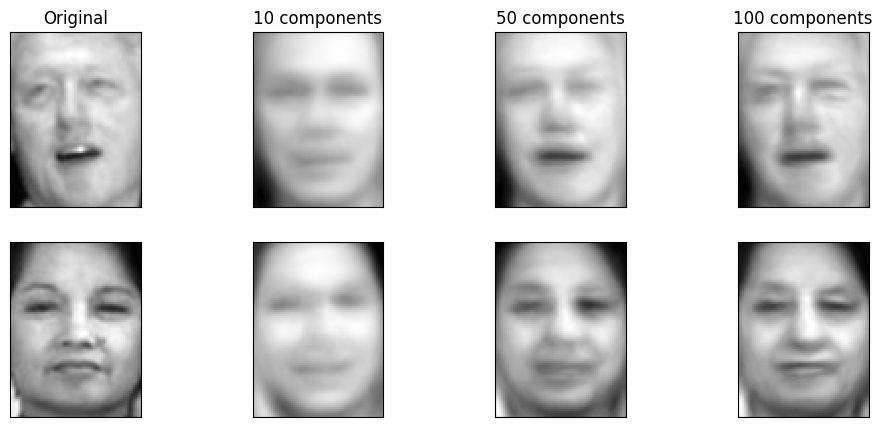

In [103]:
import warnings
import matplotlib.pyplot as plt
from sklearn.decomposition import NMF

warnings.filterwarnings('ignore')

# Komponen yang lebih ringan (10, 50, 100) agar Colab tidak hang
components_list = [10, 50, 100]
fig, axes = plt.subplots(2, len(components_list) + 1, figsize=(12, 5),
                         subplot_kw={'xticks': (), 'yticks': ()})

# Gambar asli
axes[0, 0].imshow(X_train[0].reshape(image_shape), cmap='gray')
axes[0, 0].set_title("Original")
axes[1, 0].imshow(X_train[1].reshape(image_shape), cmap='gray')

for i, n_components in enumerate(components_list):
    nmf = NMF(n_components=n_components, random_state=0, max_iter=200)
    nmf.fit(X_train)

    X_train_nmf = nmf.transform(X_train)
    X_reconstructed = nmf.inverse_transform(X_train_nmf)

    # Plot hasil rekonstruksi
    axes[0, i + 1].imshow(X_reconstructed[0].reshape(image_shape), cmap='gray')
    axes[0, i + 1].set_title(f"{n_components} components")
    axes[1, i + 1].imshow(X_reconstructed[1].reshape(image_shape), cmap='gray')

plt.show()

Kode ini menguji rekonstruksi gambar menggunakan NMF dengan jumlah komponen yang berbeda, yaitu 10, 50, dan 100. Semakin banyak komponen yang digunakan, representasi umumnya dapat mempertahankan lebih banyak detail dari gambar asli.

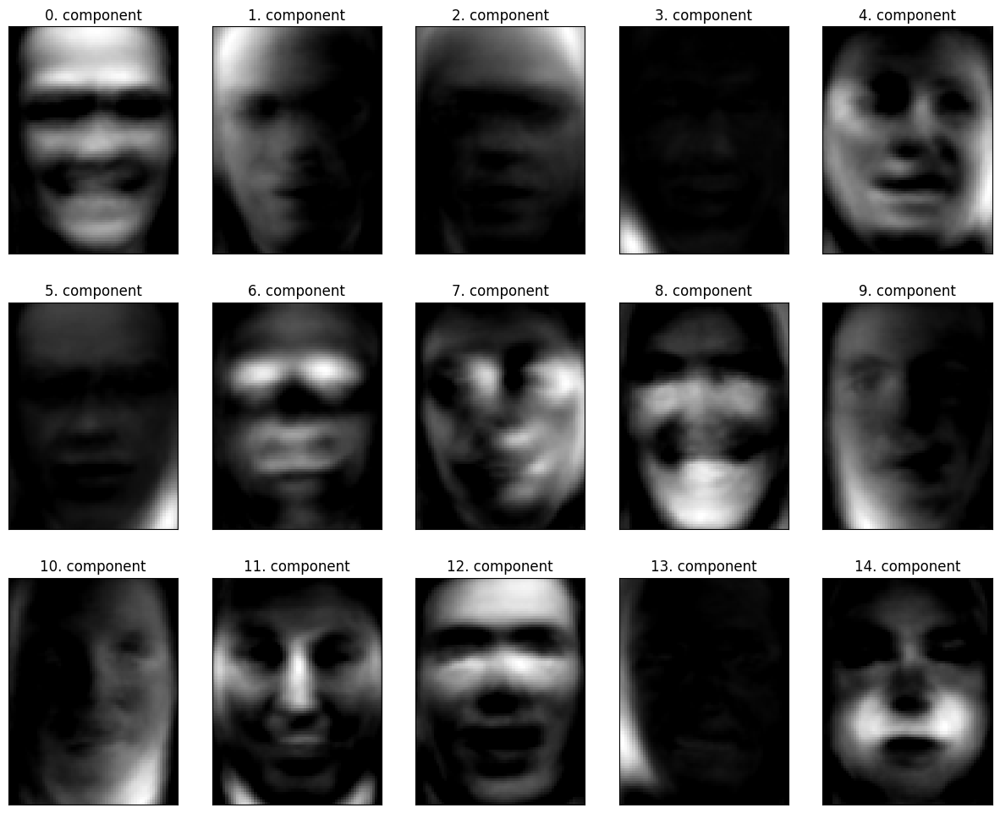

In [44]:
from sklearn.decomposition import NMF
nmf = NMF(n_components=15, random_state=0)
nmf.fit(X_train)
X_train_nmf = nmf.transform(X_train)
X_test_nmf = nmf.transform(X_test)

fig, axes = plt.subplots(3, 5, figsize=(15, 12),
                         subplot_kw={'xticks': (), 'yticks': ()})
for i, (component, ax) in enumerate(zip(nmf.components_, axes.ravel())):
    ax.imshow(component.reshape(image_shape))
    ax.set_title("{}. component".format(i))

Kode ini membuat model NMF dengan 15 komponen dan menerapkannya pada data wajah. Komponen NMF kemudian ditampilkan sebagai gambar untuk melihat pola atau bagian wajah yang dipelajari oleh masing-masing komponen.

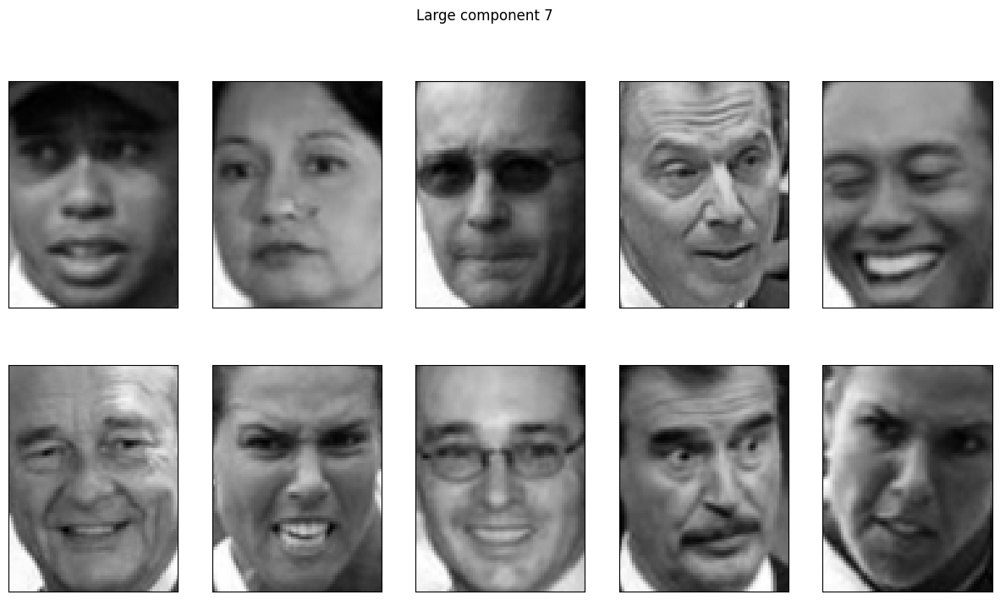

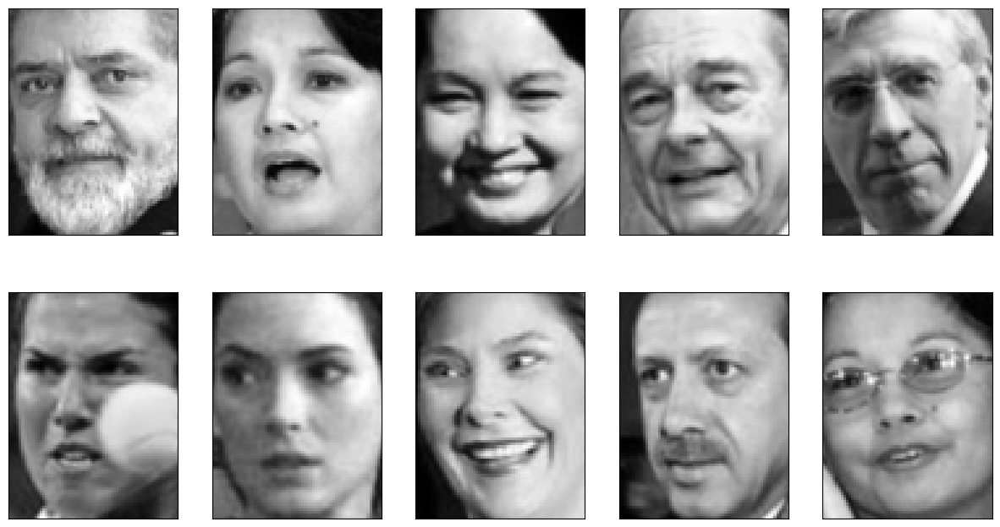

In [45]:
compn = 3
# sort by 3rd component, plot first 10 images
inds = np.argsort(X_train_nmf[:, compn])[::-1]
fig, axes = plt.subplots(2, 5, figsize=(15, 8),
                         subplot_kw={'xticks': (), 'yticks': ()})
fig.suptitle("Large component 3")
for i, (ind, ax) in enumerate(zip(inds, axes.ravel())):
    ax.imshow(X_train[ind].reshape(image_shape))

compn = 7
# sort by 7th component, plot first 10 images
inds = np.argsort(X_train_nmf[:, compn])[::-1]
fig.suptitle("Large component 7")
fig, axes = plt.subplots(2, 5, figsize=(15, 8),
                         subplot_kw={'xticks': (), 'yticks': ()})
for i, (ind, ax) in enumerate(zip(inds, axes.ravel())):
    ax.imshow(X_train[ind].reshape(image_shape))

Kode ini mencari gambar yang memiliki nilai tinggi pada komponen NMF tertentu. Dengan mengurutkan nilai transformasi, gambar yang paling kuat berhubungan dengan komponen ke-3 dan ke-7 dapat diamati sehingga makna visual dari komponen tersebut lebih mudah dipahami.

Text(0, 0.5, 'Signal')

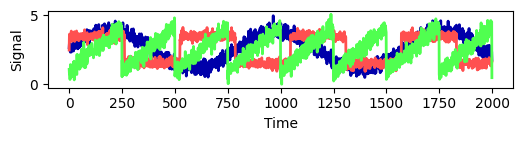

In [46]:
S = mglearn.datasets.make_signals()
plt.figure(figsize=(6, 1))
plt.plot(S, '-')
plt.xlabel("Time")
plt.ylabel("Signal")

Kode ini membuat beberapa sinyal sumber menggunakan dataset bantuan dari `mglearn` dan menampilkannya terhadap waktu. Sinyal tersebut nantinya digunakan sebagai sumber yang akan dicampurkan menjadi data observasi berdimensi lebih tinggi.

In [47]:
# Mix data into a 100 dimensional state
A = np.random.RandomState(0).uniform(size=(100, 3))
X = np.dot(S, A.T)
print("Shape of measurements: {}".format(X.shape))

Shape of measurements: (2000, 100)


Kode ini mencampurkan tiga sinyal sumber menjadi 100 pengukuran menggunakan matriks acak. Hasilnya memiliki 100 fitur pengukuran, sehingga kode ini mensimulasikan kondisi ketika beberapa sumber asli tercampur di dalam data observasi.

In [48]:
nmf = NMF(n_components=3, random_state=42)
S_ = nmf.fit_transform(X)
print("Recovered signal shape: {}".format(S_.shape))

Recovered signal shape: (2000, 3)


Kode ini menggunakan NMF untuk mencoba memisahkan kembali tiga sinyal sumber dari data observasi yang sudah tercampur. `fit_transform` menghasilkan representasi tiga komponen yang diharapkan dapat mendekati struktur sinyal asli.

In [49]:
pca = PCA(n_components=3)
H = pca.fit_transform(X)

Kode ini menggunakan PCA dengan tiga komponen untuk mereduksi data observasi yang sama. Hasil PCA kemudian digunakan sebagai pembanding terhadap sinyal yang dipulihkan menggunakan NMF.

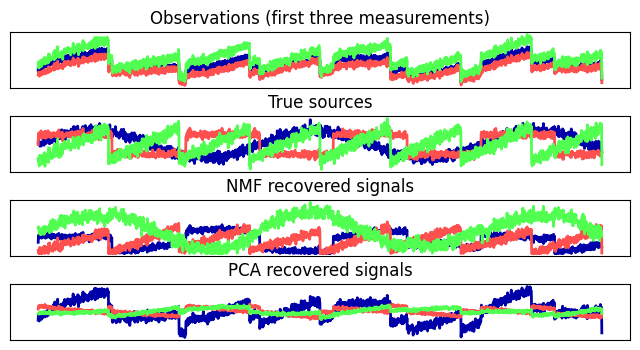

In [50]:
models = [X, S, S_, H]
names = ['Observations (first three measurements)',
         'True sources',
         'NMF recovered signals',
         'PCA recovered signals']

fig, axes = plt.subplots(4, figsize=(8, 4), gridspec_kw={'hspace': .5},
                         subplot_kw={'xticks': (), 'yticks': ()})

for model, name, ax in zip(models, names, axes):
    ax.set_title(name)
    ax.plot(model[:, :3], '-')

Kode ini membandingkan empat jenis data, yaitu observasi hasil pencampuran, sumber asli, hasil pemulihan NMF, dan hasil pemulihan PCA. Keempatnya diplot sehingga dapat dilihat secara visual seberapa dekat hasil reduksi atau pemisahan dengan sinyal sumber sebenarnya.

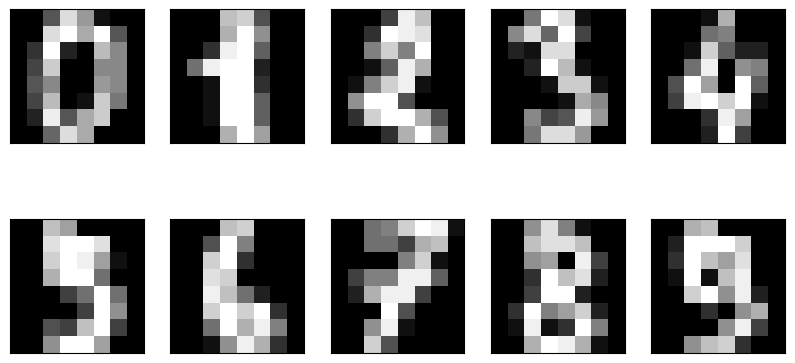

In [51]:
from sklearn.datasets import load_digits
digits = load_digits()

fig, axes = plt.subplots(2, 5, figsize=(10, 5),
                         subplot_kw={'xticks':(), 'yticks': ()})
for ax, img in zip(axes.ravel(), digits.images):
    ax.imshow(img)

Kode ini memuat dataset angka tulisan tangan `digits` dari scikit-learn dan menampilkan beberapa gambar digit. Tujuannya adalah melihat bentuk data sebelum dilakukan reduksi dimensi menggunakan PCA dan t-SNE.

Text(0, 0.5, 'Second principal component')

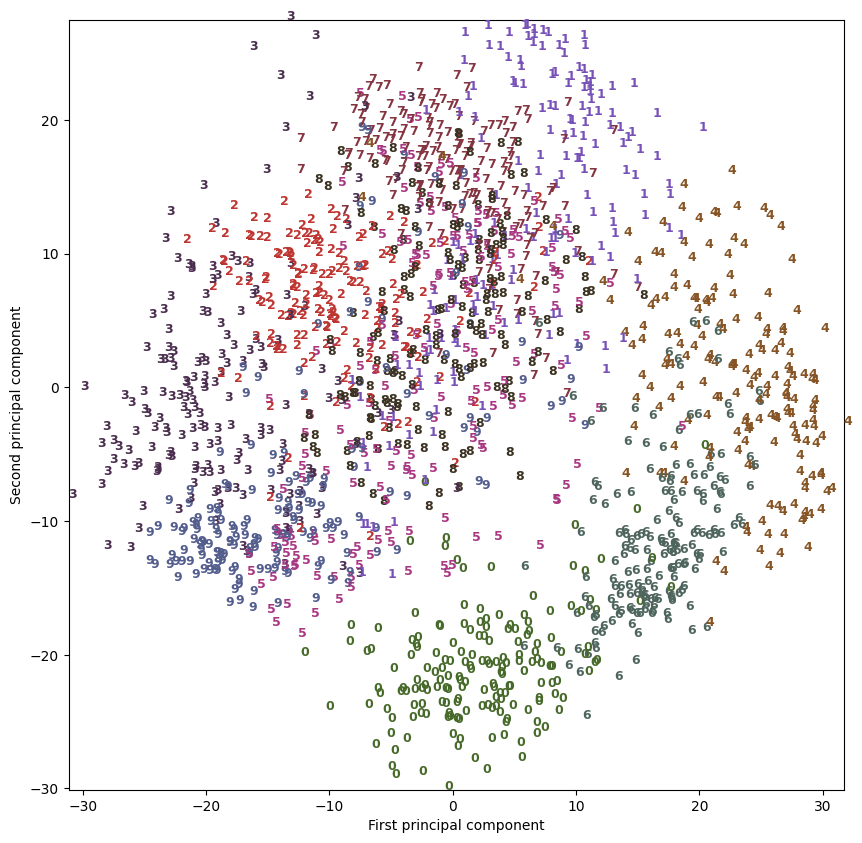

In [52]:
# build a PCA model
pca = PCA(n_components=2)
pca.fit(digits.data)
# transform the digits data onto the first two principal components
digits_pca = pca.transform(digits.data)
colors = ["#476A2A", "#7851B8", "#BD3430", "#4A2D4E", "#875525",
          "#A83683", "#4E655E", "#853541", "#3A3120", "#535D8E"]
plt.figure(figsize=(10, 10))
plt.xlim(digits_pca[:, 0].min(), digits_pca[:, 0].max())
plt.ylim(digits_pca[:, 1].min(), digits_pca[:, 1].max())
for i in range(len(digits.data)):
    # actually plot the digits as text instead of using scatter
    plt.text(digits_pca[i, 0], digits_pca[i, 1], str(digits.target[i]),
             color = colors[digits.target[i]],
             fontdict={'weight': 'bold', 'size': 9})
plt.xlabel("First principal component")
plt.ylabel("Second principal component")

Kode ini menerapkan PCA pada dataset digit dan mempertahankan dua komponen utama. Setiap data kemudian diplot berdasarkan dua komponen tersebut dan diberi label angka, sehingga dapat diamati penyebaran digit dalam ruang dua dimensi.

In [53]:
from sklearn.manifold import TSNE
tsne = TSNE(random_state=42)
# use fit_transform instead of fit, as TSNE has no transform method
digits_tsne = tsne.fit_transform(digits.data)

Kode ini menerapkan t-SNE pada dataset digit untuk menghasilkan representasi dua dimensi. Berbeda dengan PCA, t-SNE dirancang terutama untuk mempertahankan hubungan kedekatan lokal antar data, sehingga sering digunakan untuk visualisasi struktur kelompok yang kompleks.

Text(0, 0.5, 't-SNE feature 1')

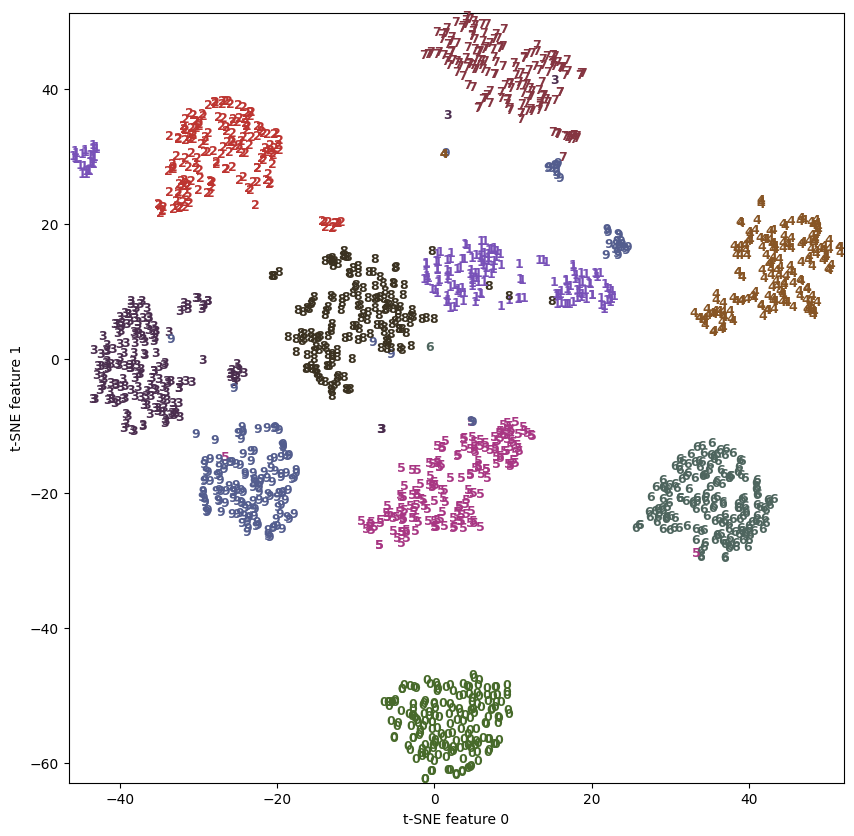

In [54]:
plt.figure(figsize=(10, 10))
plt.xlim(digits_tsne[:, 0].min(), digits_tsne[:, 0].max() + 1)
plt.ylim(digits_tsne[:, 1].min(), digits_tsne[:, 1].max() + 1)
for i in range(len(digits.data)):
    # actually plot the digits as text instead of using scatter
    plt.text(digits_tsne[i, 0], digits_tsne[i, 1], str(digits.target[i]),
             color = colors[digits.target[i]],
             fontdict={'weight': 'bold', 'size': 9})
plt.xlabel("t-SNE feature 0")
plt.ylabel("t-SNE feature 1")

Kode ini memvisualisasikan hasil t-SNE dari dataset digit. Setiap titik ditampilkan sebagai angka sesuai label aslinya, sehingga kedekatan antar kelompok digit dapat diamati secara visual.

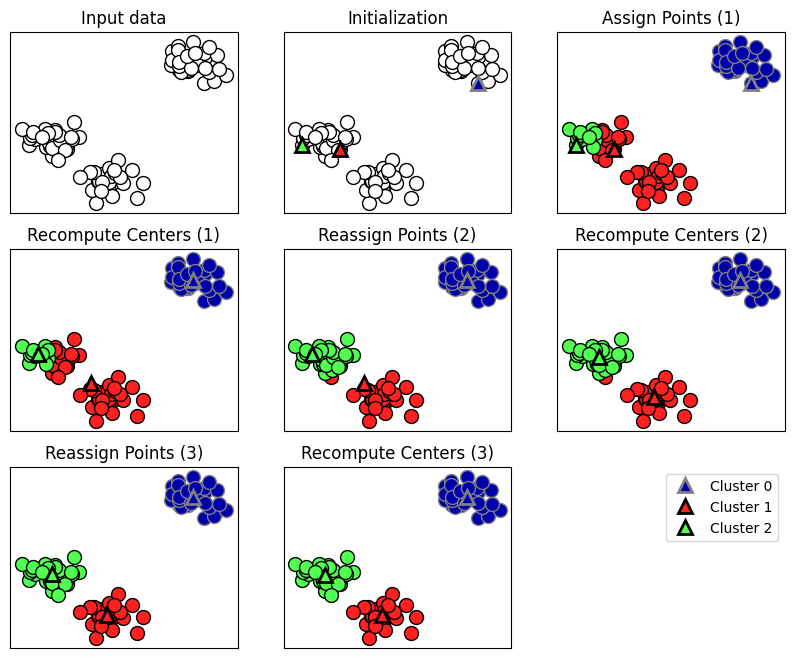

In [55]:
mglearn.plots.plot_kmeans_algorithm()

Kode ini menampilkan ilustrasi langkah-langkah algoritma k-Means. Visualisasi digunakan untuk memahami proses penentuan pusat cluster, pemberian anggota cluster, dan pembaruan pusat cluster secara berulang.

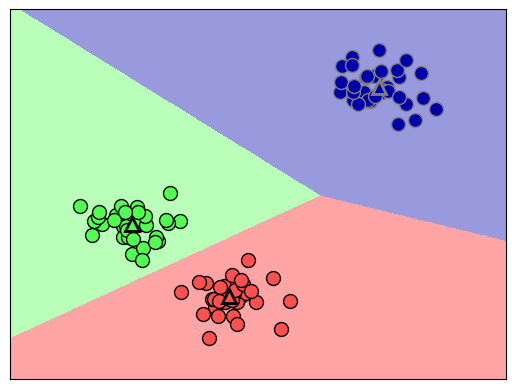

In [56]:
mglearn.plots.plot_kmeans_boundaries()

Kode ini menampilkan ilustrasi batas wilayah cluster pada k-Means. Setiap pusat cluster membentuk wilayah berdasarkan kedekatan titik terhadap pusat tersebut.

In [57]:
from sklearn.datasets import make_blobs
from sklearn.cluster import KMeans

# generate synthetic two-dimensional data
X, y = make_blobs(random_state=1)

# build the clustering model
kmeans = KMeans(n_clusters=3)
kmeans.fit(X)

KMeans(n_clusters=3)

Kode ini membuat data sintetis menggunakan `make_blobs` dan membangun model k-Means dengan tiga cluster. Model kemudian dilatih dengan `fit()` untuk menentukan pembagian data berdasarkan kedekatan terhadap pusat cluster.

In [58]:
print("Cluster memberships:\n{}".format(kmeans.labels_))

Cluster memberships:
[1 0 0 0 2 2 2 0 1 1 0 0 2 1 2 2 2 1 0 0 2 0 2 1 0 2 2 1 1 2 1 1 2 1 0 2 0
 0 0 2 2 0 1 0 0 2 1 1 1 1 0 2 2 2 1 2 0 0 1 1 0 2 2 0 0 2 1 2 1 0 0 0 2 1
 1 0 2 2 1 0 1 0 0 2 1 1 1 1 0 1 2 1 1 0 0 2 2 1 2 1]


Kode ini menampilkan label cluster yang diberikan k-Means untuk setiap data. Label tersebut berupa angka yang menunjukkan cluster tempat masing-masing titik dimasukkan oleh model.

In [59]:
print(kmeans.predict(X))

[1 0 0 0 2 2 2 0 1 1 0 0 2 1 2 2 2 1 0 0 2 0 2 1 0 2 2 1 1 2 1 1 2 1 0 2 0
 0 0 2 2 0 1 0 0 2 1 1 1 1 0 2 2 2 1 2 0 0 1 1 0 2 2 0 0 2 1 2 1 0 0 0 2 1
 1 0 2 2 1 0 1 0 0 2 1 1 1 1 0 1 2 1 1 0 0 2 2 1 2 1]


Kode ini menggunakan `predict()` untuk menentukan cluster dari data berdasarkan pusat cluster yang sudah dipelajari. Hasilnya dapat digunakan untuk melihat kembali pembagian cluster yang dibuat model.

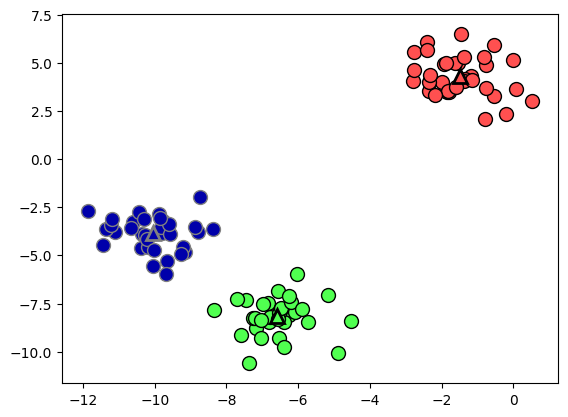

In [60]:
mglearn.discrete_scatter(X[:, 0], X[:, 1], kmeans.labels_, markers='o')
mglearn.discrete_scatter(
    kmeans.cluster_centers_[:, 0], kmeans.cluster_centers_[:, 1], [0, 1, 2],
    markers='^', markeredgewidth=2)

Kode ini memvisualisasikan hasil clustering k-Means dan posisi pusat cluster. Titik data diberi label berdasarkan cluster, sedangkan tanda segitiga digunakan untuk menunjukkan lokasi pusat masing-masing cluster.

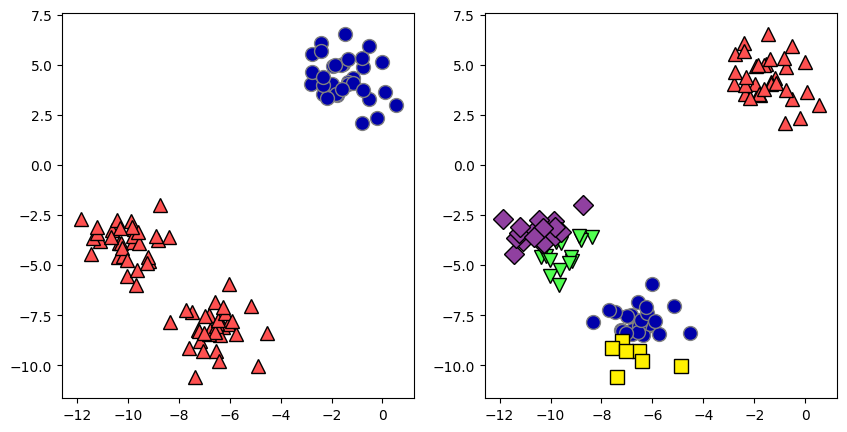

In [61]:
fig, axes = plt.subplots(1, 2, figsize=(10, 5))

# using two cluster centers:
kmeans = KMeans(n_clusters=2)
kmeans.fit(X)
assignments = kmeans.labels_

mglearn.discrete_scatter(X[:, 0], X[:, 1], assignments, ax=axes[0])

# using five cluster centers:
kmeans = KMeans(n_clusters=5)
kmeans.fit(X)
assignments = kmeans.labels_

mglearn.discrete_scatter(X[:, 0], X[:, 1], assignments, ax=axes[1])

Kode ini membandingkan k-Means dengan jumlah cluster yang berbeda, yaitu 2 dan 5. Perubahan nilai `n_clusters` menunjukkan bahwa jumlah cluster harus ditentukan sesuai struktur data karena hasil pembagian dapat berubah ketika jumlah pusat cluster diubah.

Text(0, 0.5, 'Feature 1')

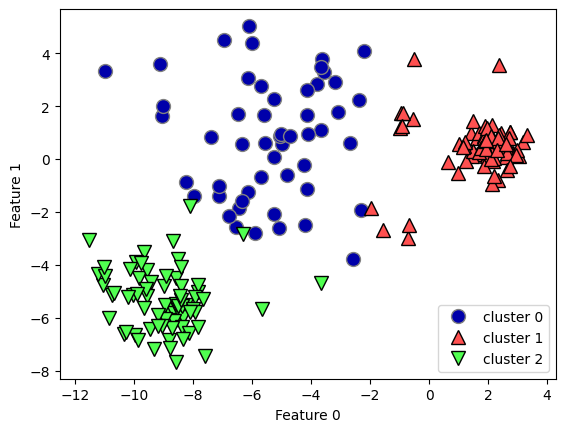

In [62]:
X_varied, y_varied = make_blobs(n_samples=200,
                                cluster_std=[1.0, 2.5, 0.5],
                                random_state=170)
y_pred = KMeans(n_clusters=3, random_state=0).fit_predict(X_varied)

mglearn.discrete_scatter(X_varied[:, 0], X_varied[:, 1], y_pred)
plt.legend(["cluster 0", "cluster 1", "cluster 2"], loc='best')
plt.xlabel("Feature 0")
plt.ylabel("Feature 1")

Kode ini membuat data dengan tingkat penyebaran cluster yang berbeda menggunakan `cluster_std`. k-Means kemudian digunakan untuk membagi data menjadi tiga cluster sehingga dapat dilihat pengaruh bentuk dan penyebaran data terhadap hasil clustering.

Text(0, 0.5, 'Feature 1')

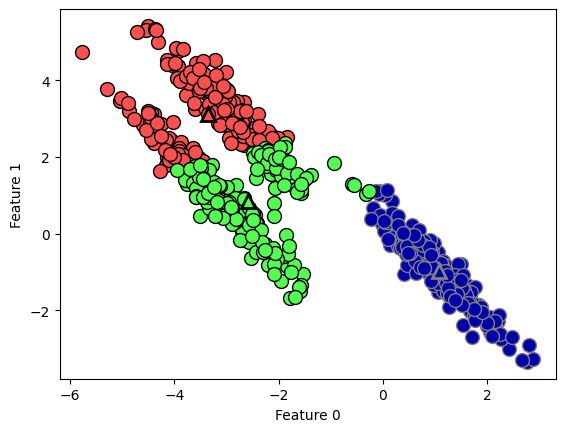

In [63]:
# generate some random cluster data
X, y = make_blobs(random_state=170, n_samples=600)
rng = np.random.RandomState(74)

# transform the data to be stretched
transformation = rng.normal(size=(2, 2))
X = np.dot(X, transformation)

# cluster the data into three clusters
kmeans = KMeans(n_clusters=3)
kmeans.fit(X)
y_pred = kmeans.predict(X)

# plot the cluster assignments and cluster centers
mglearn.discrete_scatter(X[:, 0], X[:, 1], kmeans.labels_, markers='o')
mglearn.discrete_scatter(
    kmeans.cluster_centers_[:, 0], kmeans.cluster_centers_[:, 1], [0, 1, 2],
    markers='^', markeredgewidth=2)
plt.xlabel("Feature 0")
plt.ylabel("Feature 1")

Kode ini mengubah bentuk data blob menggunakan transformasi matriks sehingga cluster menjadi memanjang atau tidak berbentuk bulat. k-Means tetap digunakan untuk melakukan clustering, sehingga kode ini menunjukkan bahwa asumsi bentuk cluster dapat memengaruhi hasil k-Means.

Text(0, 0.5, 'Feature 1')

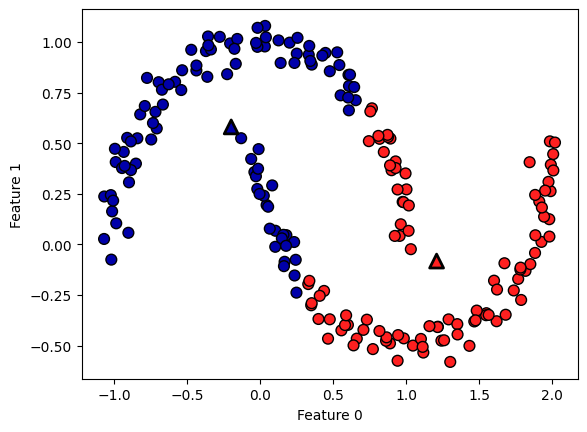

In [64]:
# generate synthetic two_moons data (with less noise this time)
from sklearn.datasets import make_moons
X, y = make_moons(n_samples=200, noise=0.05, random_state=0)

# cluster the data into two clusters
kmeans = KMeans(n_clusters=2)
kmeans.fit(X)
y_pred = kmeans.predict(X)

# plot the cluster assignments and cluster centers
plt.scatter(X[:, 0], X[:, 1], c=y_pred, cmap=mglearn.cm2, s=60, edgecolor='k')
plt.scatter(kmeans.cluster_centers_[:, 0], kmeans.cluster_centers_[:, 1],
            marker='^', c=[mglearn.cm2(0), mglearn.cm2(1)], s=100, linewidth=2,
            edgecolor='k')
plt.xlabel("Feature 0")
plt.ylabel("Feature 1")

Kode ini menggunakan dataset two-moons yang memiliki bentuk melengkung dan melakukan clustering dengan k-Means. Hasil visualisasi menunjukkan bagaimana k-Means membagi data berdasarkan kedekatan terhadap pusat sehingga bentuk cluster non-bulat dapat menjadi tantangan bagi algoritma ini.

In [65]:
X_train, X_test, y_train, y_test = train_test_split(
    X_people, y_people, stratify=y_people, random_state=0)
nmf = NMF(n_components=100, random_state=0)
nmf.fit(X_train)
pca = PCA(n_components=100, random_state=0)
pca.fit(X_train)
kmeans = KMeans(n_clusters=100, random_state=0)
kmeans.fit(X_train)

X_reconstructed_pca = pca.inverse_transform(pca.transform(X_test))
X_reconstructed_kmeans = kmeans.cluster_centers_[kmeans.predict(X_test)]
X_reconstructed_nmf = np.dot(nmf.transform(X_test), nmf.components_)

Kode ini membandingkan rekonstruksi gambar wajah menggunakan tiga pendekatan, yaitu NMF, PCA, dan k-Means. Masing-masing metode dibuat dengan 100 komponen atau pusat, kemudian data testing direkonstruksi kembali untuk melihat bagaimana setiap metode merepresentasikan gambar.

Text(0, 0.5, 'nmf')

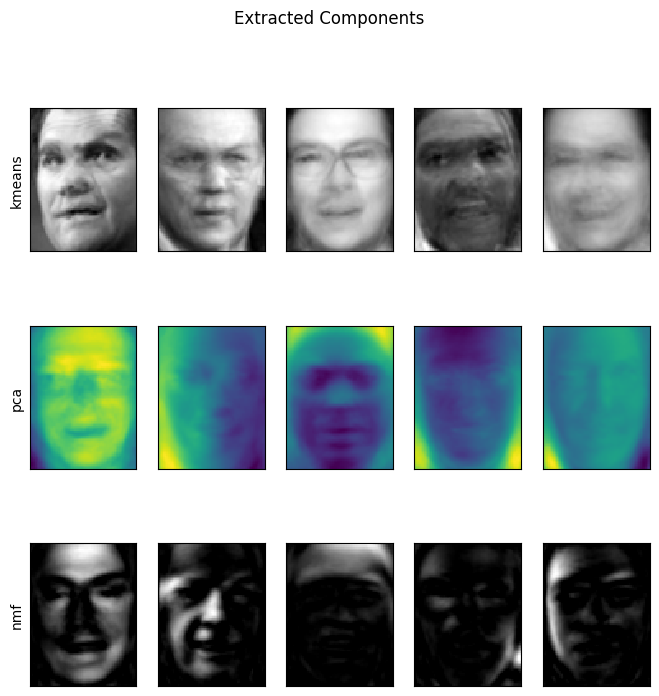

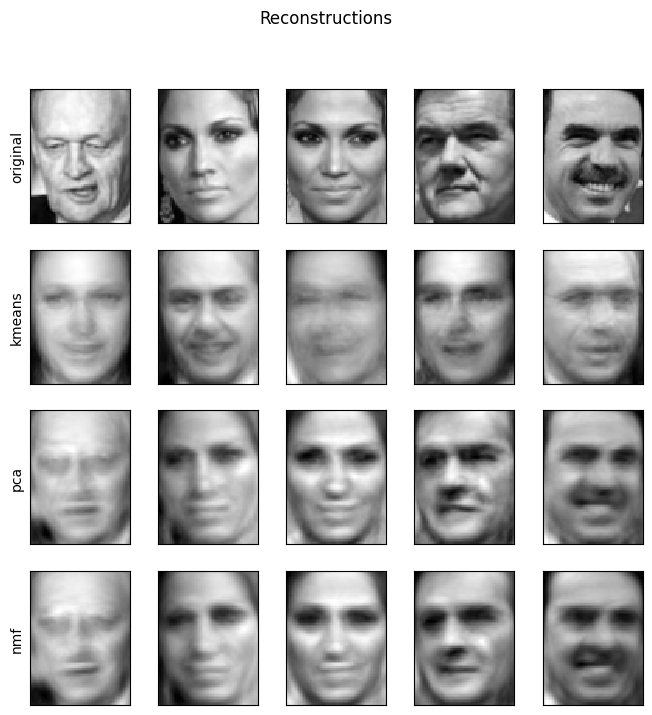

In [66]:
fig, axes = plt.subplots(3, 5, figsize=(8, 8),
                         subplot_kw={'xticks': (), 'yticks': ()})
fig.suptitle("Extracted Components")
for ax, comp_kmeans, comp_pca, comp_nmf in zip(
        axes.T, kmeans.cluster_centers_, pca.components_, nmf.components_):
    ax[0].imshow(comp_kmeans.reshape(image_shape))
    ax[1].imshow(comp_pca.reshape(image_shape), cmap='viridis')
    ax[2].imshow(comp_nmf.reshape(image_shape))

axes[0, 0].set_ylabel("kmeans")
axes[1, 0].set_ylabel("pca")
axes[2, 0].set_ylabel("nmf")

fig, axes = plt.subplots(4, 5, subplot_kw={'xticks': (), 'yticks': ()},
                         figsize=(8, 8))
fig.suptitle("Reconstructions")
for ax, orig, rec_kmeans, rec_pca, rec_nmf in zip(
        axes.T, X_test, X_reconstructed_kmeans, X_reconstructed_pca,
        X_reconstructed_nmf):

    ax[0].imshow(orig.reshape(image_shape))
    ax[1].imshow(rec_kmeans.reshape(image_shape))
    ax[2].imshow(rec_pca.reshape(image_shape))
    ax[3].imshow(rec_nmf.reshape(image_shape))

axes[0, 0].set_ylabel("original")
axes[1, 0].set_ylabel("kmeans")
axes[2, 0].set_ylabel("pca")
axes[3, 0].set_ylabel("nmf")

Kode ini menampilkan komponen yang diperoleh dari k-Means, PCA, dan NMF sekaligus membandingkan hasil rekonstruksi gambar. Dengan visualisasi ini, perbedaan karakteristik representasi dari ketiga metode dapat diamati secara langsung.

Cluster memberships:
[8 4 6 3 1 1 5 2 8 4 9 2 1 4 7 5 0 2 0 7 1 2 0 4 9 6 1 1 6 0 8 9 2 6 8 1 2
 5 3 6 2 7 8 6 4 9 5 7 6 2 7 2 1 3 4 8 0 4 0 9 2 3 1 8 4 3 9 4 9 3 2 3 2 6
 2 3 6 8 0 2 1 9 2 1 6 9 5 9 2 1 0 5 1 7 1 1 4 2 3 6 4 1 9 5 3 6 3 7 4 0 7
 9 9 3 8 4 8 1 2 8 8 7 6 9 6 7 5 6 4 1 5 7 3 6 4 4 4 3 1 8 6 6 0 9 7 5 6 4
 0 6 2 4 8 0 2 9 4 2 0 0 6 4 0 4 2 1 0 2 4 2 0 3 3 7 6 2 1 7 7 0 4 3 1 4 1
 0 9 2 3 7 3 0 8 5 6 7 1 6 9 4]


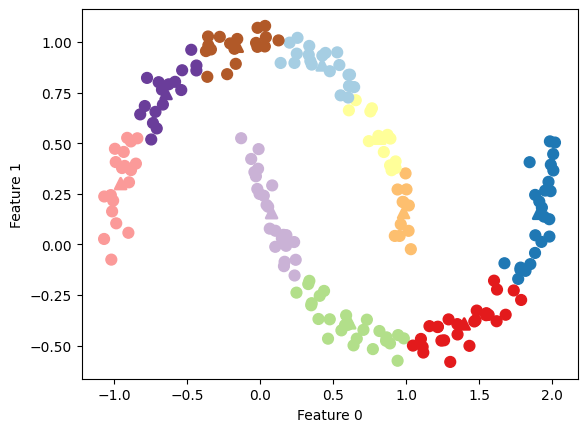

In [67]:
X, y = make_moons(n_samples=200, noise=0.05, random_state=0)

kmeans = KMeans(n_clusters=10, random_state=0)
kmeans.fit(X)
y_pred = kmeans.predict(X)

plt.scatter(X[:, 0], X[:, 1], c=y_pred, s=60, cmap='Paired')
plt.scatter(kmeans.cluster_centers_[:, 0], kmeans.cluster_centers_[:, 1], s=60,
            marker='^', c=range(kmeans.n_clusters), linewidth=2, cmap='Paired')
plt.xlabel("Feature 0")
plt.ylabel("Feature 1")
print("Cluster memberships:\n{}".format(y_pred))

Kode ini melakukan k-Means pada data two-moons dengan 10 cluster. Hasilnya divisualisasikan bersama pusat cluster dan label setiap titik, kemudian jumlah anggota cluster ditampilkan untuk melihat pembagian data yang dihasilkan.

In [68]:
distance_features = kmeans.transform(X)
print("Distance feature shape: {}".format(distance_features.shape))
print("Distance features:\n{}".format(distance_features))

Distance feature shape: (200, 10)
Distance features:
[[0.537 1.15  0.932 ... 1.48  0.003 1.077]
 [1.741 0.606 1.007 ... 2.529 1.208 2.237]
 [0.757 1.931 0.916 ... 0.783 0.876 0.718]
 ...
 [0.927 1.738 0.579 ... 1.115 0.834 1.041]
 [0.323 1.976 1.479 ... 0.814 0.846 0.284]
 [1.633 0.472 1.023 ... 2.466 1.098 2.148]]


Kode ini menggunakan `kmeans.transform(X)` untuk menghitung jarak setiap titik terhadap seluruh pusat cluster. Karena terdapat sejumlah pusat cluster, setiap data akan memiliki beberapa nilai jarak yang dapat digunakan sebagai representasi fitur berdasarkan kedekatannya dengan pusat cluster.

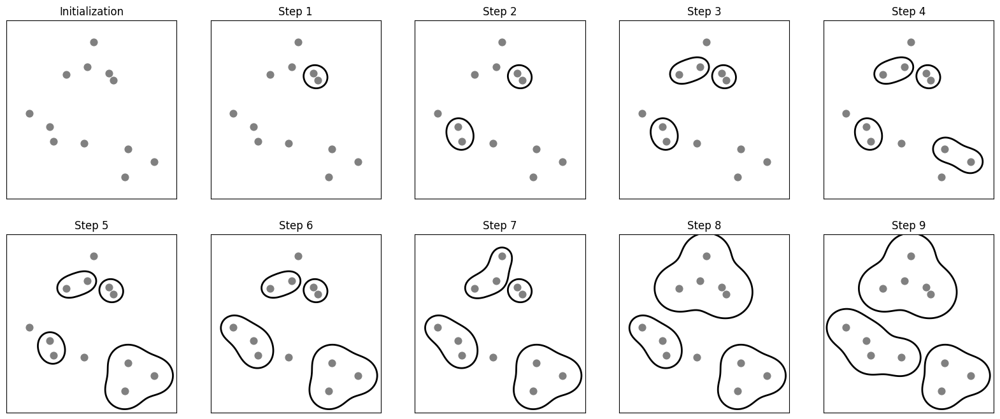

In [69]:
mglearn.plots.plot_agglomerative_algorithm()

Kode ini menampilkan ilustrasi algoritma agglomerative clustering. Algoritma ini bekerja secara hierarkis dengan menggabungkan data atau cluster yang paling dekat secara bertahap sampai terbentuk struktur cluster yang lebih besar.

Text(0, 0.5, 'Feature 1')

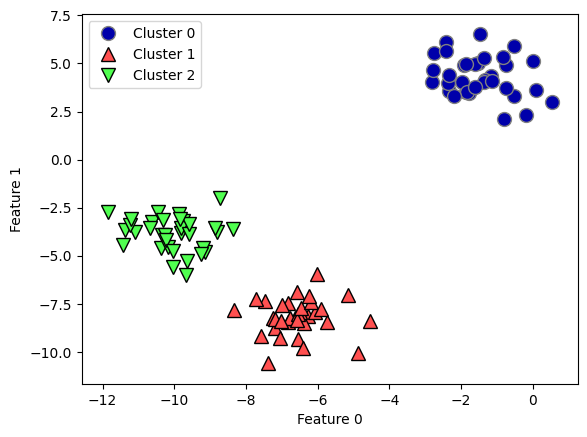

In [70]:
from sklearn.cluster import AgglomerativeClustering
X, y = make_blobs(random_state=1)

agg = AgglomerativeClustering(n_clusters=3)
assignment = agg.fit_predict(X)

mglearn.discrete_scatter(X[:, 0], X[:, 1], assignment)
plt.legend(["Cluster 0", "Cluster 1", "Cluster 2"], loc="best")
plt.xlabel("Feature 0")
plt.ylabel("Feature 1")

Kode ini membuat model `AgglomerativeClustering` dengan tiga cluster dan menerapkannya pada data sintetis. Hasil label cluster kemudian divisualisasikan untuk melihat pembagian data yang dihasilkan secara hierarkis.

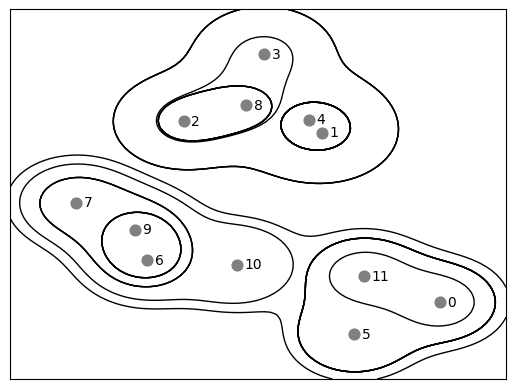

In [71]:
mglearn.plots.plot_agglomerative()

Kode ini menampilkan ilustrasi proses agglomerative clustering secara lebih lengkap. Visualisasi membantu memperlihatkan bagaimana beberapa titik digabungkan menjadi cluster yang semakin besar.

Text(0, 0.5, 'Cluster distance')

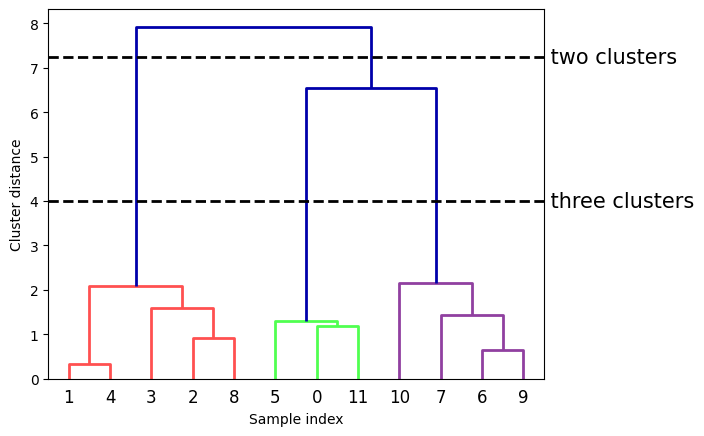

In [72]:
# Import the dendrogram function and the ward clustering function from SciPy
from scipy.cluster.hierarchy import dendrogram, ward

X, y = make_blobs(random_state=0, n_samples=12)
# Apply the ward clustering to the data array X
# The SciPy ward function returns an array that specifies the distances
# bridged when performing agglomerative clustering
linkage_array = ward(X)
# Now we plot the dendrogram for the linkage_array containing the distances
# between clusters
dendrogram(linkage_array)

# mark the cuts in the tree that signify two or three clusters
ax = plt.gca()
bounds = ax.get_xbound()
ax.plot(bounds, [7.25, 7.25], '--', c='k')
ax.plot(bounds, [4, 4], '--', c='k')

ax.text(bounds[1], 7.25, ' two clusters', va='center', fontdict={'size': 15})
ax.text(bounds[1], 4, ' three clusters', va='center', fontdict={'size': 15})
plt.xlabel("Sample index")
plt.ylabel("Cluster distance")

Kode ini menggunakan metode Ward dari SciPy untuk menghitung penggabungan cluster dan menghasilkan `linkage_array`. Hasilnya divisualisasikan sebagai dendrogram, sehingga proses penggabungan cluster dan jarak antar penggabungan dapat diamati. Garis horizontal pada grafik menunjukkan kemungkinan pemotongan dendrogram untuk mendapatkan jumlah cluster tertentu.

In [73]:
from sklearn.cluster import DBSCAN
X, y = make_blobs(random_state=0, n_samples=12)

dbscan = DBSCAN()
clusters = dbscan.fit_predict(X)
print("Cluster memberships:\n{}".format(clusters))

Cluster memberships:
[-1 -1 -1 -1 -1 -1 -1 -1 -1 -1 -1 -1]


Kode ini membuat model DBSCAN dengan parameter default dan menerapkannya pada data sintetis. DBSCAN mengelompokkan titik berdasarkan kepadatan dan dapat memberikan label `-1` untuk titik yang dianggap sebagai noise.

min_samples: 2 eps: 1.000000  cluster: [-1  0  0 -1  0 -1  1  1  0  1 -1 -1]
min_samples: 2 eps: 1.500000  cluster: [0 1 1 1 1 0 2 2 1 2 2 0]
min_samples: 2 eps: 2.000000  cluster: [0 1 1 1 1 0 0 0 1 0 0 0]
min_samples: 2 eps: 3.000000  cluster: [0 0 0 0 0 0 0 0 0 0 0 0]
min_samples: 3 eps: 1.000000  cluster: [-1  0  0 -1  0 -1  1  1  0  1 -1 -1]
min_samples: 3 eps: 1.500000  cluster: [0 1 1 1 1 0 2 2 1 2 2 0]
min_samples: 3 eps: 2.000000  cluster: [0 1 1 1 1 0 0 0 1 0 0 0]
min_samples: 3 eps: 3.000000  cluster: [0 0 0 0 0 0 0 0 0 0 0 0]
min_samples: 5 eps: 1.000000  cluster: [-1 -1 -1 -1 -1 -1 -1 -1 -1 -1 -1 -1]
min_samples: 5 eps: 1.500000  cluster: [-1  0  0  0  0 -1 -1 -1  0 -1 -1 -1]
min_samples: 5 eps: 2.000000  cluster: [-1  0  0  0  0 -1 -1 -1  0 -1 -1 -1]
min_samples: 5 eps: 3.000000  cluster: [0 0 0 0 0 0 0 0 0 0 0 0]


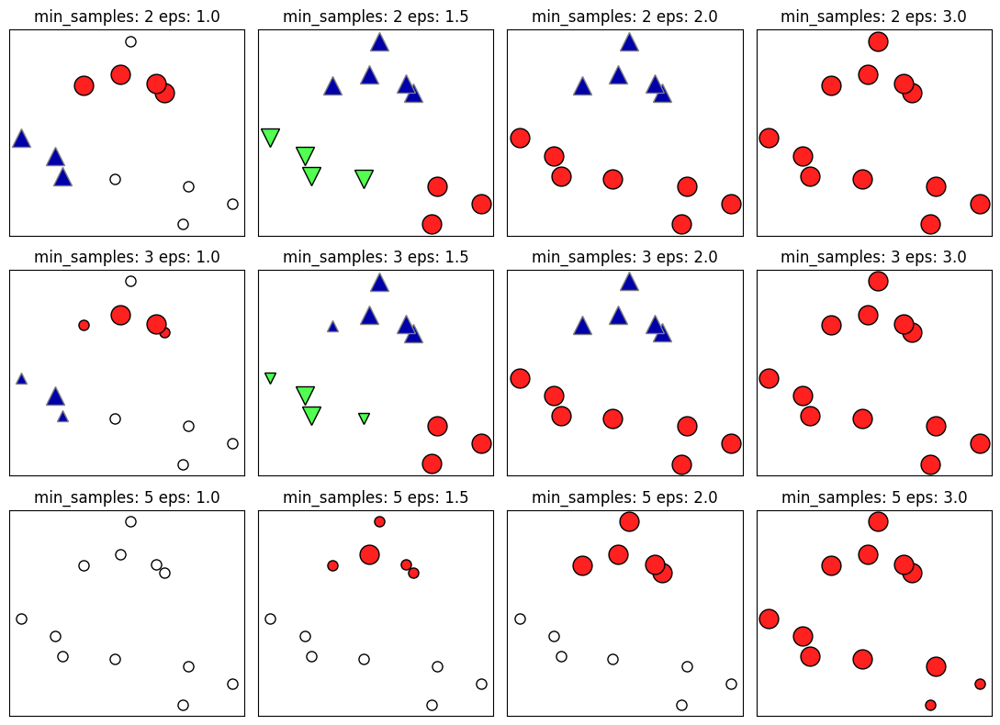

In [74]:
mglearn.plots.plot_dbscan()

Kode ini menampilkan ilustrasi konsep DBSCAN. Visualisasi membantu memahami perbedaan titik inti, titik yang berada di sekitar cluster, dan titik noise berdasarkan kepadatan lingkungan data.

Text(0, 0.5, 'Feature 1')

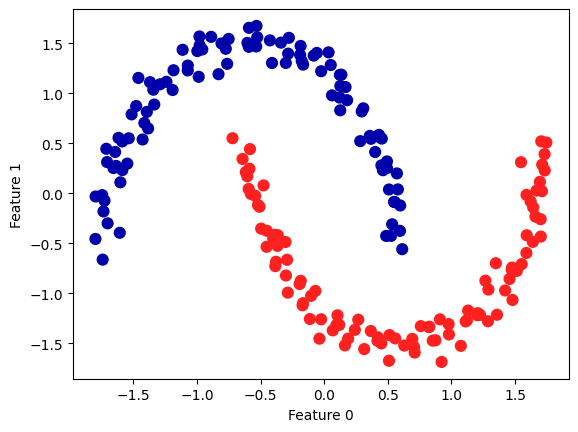

In [75]:
X, y = make_moons(n_samples=200, noise=0.05, random_state=0)

# Rescale the data to zero mean and unit variance
scaler = StandardScaler()
scaler.fit(X)
X_scaled = scaler.transform(X)

dbscan = DBSCAN()
clusters = dbscan.fit_predict(X_scaled)
# plot the cluster assignments
plt.scatter(X_scaled[:, 0], X_scaled[:, 1], c=clusters, cmap=mglearn.cm2, s=60)
plt.xlabel("Feature 0")
plt.ylabel("Feature 1")

Kode ini menerapkan DBSCAN pada dataset two-moons setelah data distandardisasi menggunakan `StandardScaler`. Hasil label cluster kemudian divisualisasikan untuk melihat kemampuan DBSCAN dalam menemukan cluster yang memiliki bentuk tidak beraturan.

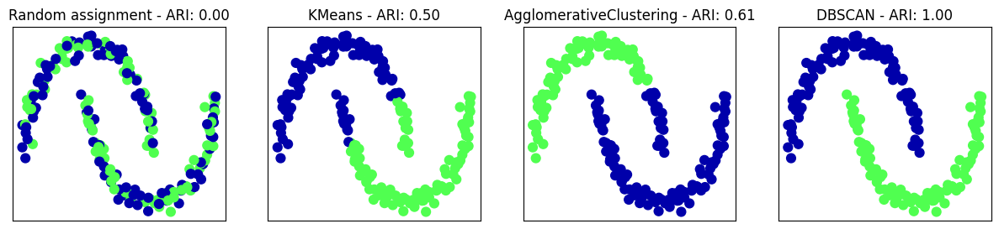

In [76]:
from sklearn.metrics.cluster import adjusted_rand_score
X, y = make_moons(n_samples=200, noise=0.05, random_state=0)

# Rescale the data to zero mean and unit variance
scaler = StandardScaler()
scaler.fit(X)
X_scaled = scaler.transform(X)

fig, axes = plt.subplots(1, 4, figsize=(15, 3),
                         subplot_kw={'xticks': (), 'yticks': ()})

# make a list of algorithms to use
algorithms = [KMeans(n_clusters=2), AgglomerativeClustering(n_clusters=2),
              DBSCAN()]

# create a random cluster assignment for reference
random_state = np.random.RandomState(seed=0)
random_clusters = random_state.randint(low=0, high=2, size=len(X))

# plot random assignment
axes[0].scatter(X_scaled[:, 0], X_scaled[:, 1], c=random_clusters,
                cmap=mglearn.cm3, s=60)
axes[0].set_title("Random assignment - ARI: {:.2f}".format(
        adjusted_rand_score(y, random_clusters)))

for ax, algorithm in zip(axes[1:], algorithms):
    # plot the cluster assignments and cluster centers
    clusters = algorithm.fit_predict(X_scaled)
    ax.scatter(X_scaled[:, 0], X_scaled[:, 1], c=clusters,
               cmap=mglearn.cm3, s=60)
    ax.set_title("{} - ARI: {:.2f}".format(algorithm.__class__.__name__,
                                           adjusted_rand_score(y, clusters)))

Kode ini membandingkan k-Means, agglomerative clustering, dan DBSCAN menggunakan Adjusted Rand Index (ARI). ARI dihitung dengan membandingkan hasil clustering dengan label asli sehingga dapat digunakan untuk melihat kesesuaian pengelompokan tanpa bergantung pada nomor label cluster.

In [77]:
from sklearn.metrics import accuracy_score

# these two labelings of points correspond to the same clustering
clusters1 = [0, 0, 1, 1, 0]
clusters2 = [1, 1, 0, 0, 1]
# accuracy is zero, as none of the labels are the same
print("Accuracy: {:.2f}".format(accuracy_score(clusters1, clusters2)))
# adjusted rand score is 1, as the clustering is exactly the same:
print("ARI: {:.2f}".format(adjusted_rand_score(clusters1, clusters2)))

Accuracy: 0.00
ARI: 1.00


Kode ini menunjukkan alasan mengapa `accuracy_score` tidak cocok digunakan secara langsung untuk mengevaluasi hasil clustering. Dua daftar label dapat menggunakan nomor cluster yang berbeda tetapi sebenarnya membentuk pengelompokan yang sama. ARI dapat mengenali bahwa kedua pengelompokan tersebut setara meskipun label angkanya tertukar.

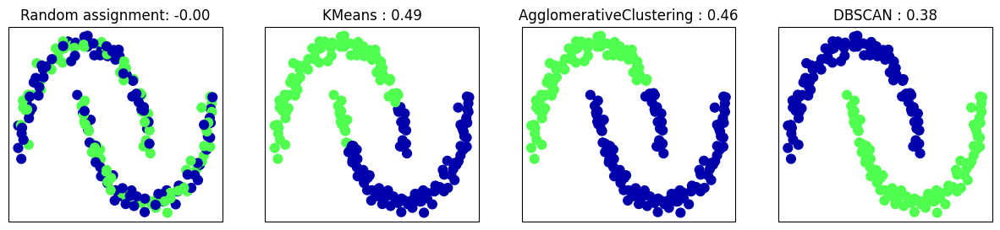

In [78]:
from sklearn.metrics.cluster import silhouette_score

X, y = make_moons(n_samples=200, noise=0.05, random_state=0)

# rescale the data to zero mean and unit variance
scaler = StandardScaler()
scaler.fit(X)
X_scaled = scaler.transform(X)

fig, axes = plt.subplots(1, 4, figsize=(15, 3),
                         subplot_kw={'xticks': (), 'yticks': ()})

# create a random cluster assignment for reference
random_state = np.random.RandomState(seed=0)
random_clusters = random_state.randint(low=0, high=2, size=len(X))

# plot random assignment
axes[0].scatter(X_scaled[:, 0], X_scaled[:, 1], c=random_clusters,
                cmap=mglearn.cm3, s=60)
axes[0].set_title("Random assignment: {:.2f}".format(
    silhouette_score(X_scaled, random_clusters)))

algorithms = [KMeans(n_clusters=2), AgglomerativeClustering(n_clusters=2),
              DBSCAN()]

for ax, algorithm in zip(axes[1:], algorithms):
    clusters = algorithm.fit_predict(X_scaled)
    # plot the cluster assignments and cluster centers
    ax.scatter(X_scaled[:, 0], X_scaled[:, 1], c=clusters, cmap=mglearn.cm3,
               s=60)
    ax.set_title("{} : {:.2f}".format(algorithm.__class__.__name__,
                                      silhouette_score(X_scaled, clusters)))

Kode ini menggunakan silhouette score untuk mengevaluasi hasil clustering. Nilai silhouette mempertimbangkan kedekatan suatu titik dengan cluster-nya dibandingkan dengan cluster lain, sehingga dapat memberikan gambaran mengenai kualitas pemisahan cluster tanpa membutuhkan label asli.

In [79]:
# extract eigenfaces from lfw data and transform data
from sklearn.decomposition import PCA
pca = PCA(n_components=100, whiten=True, random_state=0)
X_pca = pca.fit_transform(X_people)

Kode ini melakukan PCA pada data wajah dengan 100 komponen dan whitening untuk menghasilkan representasi berdimensi lebih rendah. Hasil transformasi `X_pca` kemudian digunakan sebagai input untuk proses clustering pada bagian berikutnya.

In [80]:
# apply DBSCAN with default parameters
dbscan = DBSCAN()
labels = dbscan.fit_predict(X_pca)
print("Unique labels: {}".format(np.unique(labels)))

Unique labels: [-1]


Kode ini menerapkan DBSCAN dengan parameter default pada data wajah yang sudah direduksi menggunakan PCA. `np.unique(labels)` digunakan untuk melihat label cluster yang terbentuk, termasuk kemungkinan label `-1` sebagai noise.

In [81]:
dbscan = DBSCAN(min_samples=3)
labels = dbscan.fit_predict(X_pca)
print("Unique labels: {}".format(np.unique(labels)))

Unique labels: [-1]


Kode ini mengubah parameter `min_samples` DBSCAN menjadi 3. Parameter tersebut menentukan jumlah minimum titik di sekitar suatu titik agar titik tersebut dapat dianggap sebagai titik inti, sehingga perubahan nilainya dapat memengaruhi jumlah cluster dan noise.

In [82]:
dbscan = DBSCAN(min_samples=3, eps=15)
labels = dbscan.fit_predict(X_pca)
print("Unique labels: {}".format(np.unique(labels)))

Unique labels: [-1  0]


Kode ini menggunakan `min_samples=3` dan memperbesar nilai `eps` menjadi 15. `eps` menentukan radius lingkungan yang digunakan DBSCAN untuk mencari tetangga, sehingga perubahan nilai ini dapat mengubah kepadatan yang dianggap membentuk cluster.

In [83]:
# count number of points in all clusters and noise.
# bincount doesn't allow negative numbers, so we need to add 1.
# the first number in the result corresponds to noise points
print("Number of points per cluster: {}".format(np.bincount(labels + 1)))

Number of points per cluster: [  37 2026]


Kode ini menghitung jumlah data pada setiap cluster dan jumlah noise. Karena label noise dari DBSCAN adalah `-1`, label ditambah 1 sebelum menggunakan `np.bincount` agar seluruh nilai dapat dihitung sebagai indeks array.

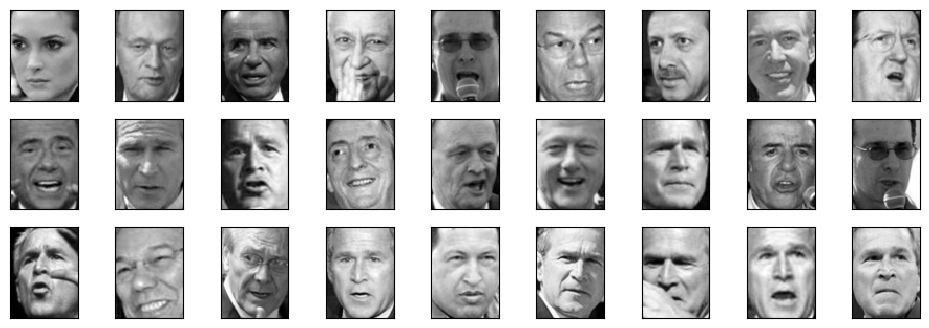

In [96]:
noise = X_people[labels==-1]

fig, axes = plt.subplots(3, 9, subplot_kw={'xticks': (), 'yticks': ()},
                         figsize=(12, 4))

for image, ax in zip(noise, axes.ravel()):
    ax.imshow(image.reshape(image_shape), cmap='gray')

plt.show()

Kode ini mengambil semua gambar yang diberi label `-1`, yaitu data yang dianggap noise oleh DBSCAN. Gambar-gambar tersebut kemudian ditampilkan agar dapat diamati karakteristik data yang tidak berhasil dimasukkan ke dalam cluster.

In [85]:
for eps in [1, 3, 5, 7, 9, 11, 13]:
    print("\neps={}".format(eps))
    dbscan = DBSCAN(eps=eps, min_samples=3)
    labels = dbscan.fit_predict(X_pca)
    print("Number of clusters: {}".format(len(np.unique(labels))))
    print("Cluster sizes: {}".format(np.bincount(labels + 1)))


eps=1
Number of clusters: 1
Cluster sizes: [2063]

eps=3
Number of clusters: 1
Cluster sizes: [2063]

eps=5
Number of clusters: 2
Cluster sizes: [2059    4]

eps=7
Number of clusters: 8
Cluster sizes: [1954   75    4   14    6    4    3    3]

eps=9
Number of clusters: 3
Cluster sizes: [1199  861    3]

eps=11
Number of clusters: 2
Cluster sizes: [ 403 1660]

eps=13
Number of clusters: 2
Cluster sizes: [ 119 1944]


Kode ini menguji beberapa nilai `eps` secara berurutan, yaitu 1 sampai 13. Untuk setiap nilai, kode menampilkan jumlah cluster dan ukuran cluster sehingga pengaruh perubahan parameter `eps` terhadap hasil DBSCAN dapat dibandingkan.

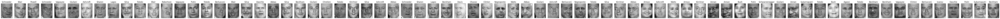

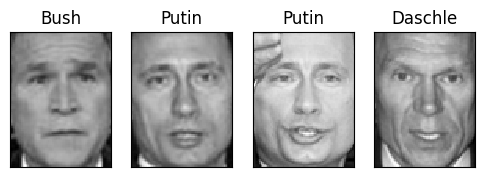

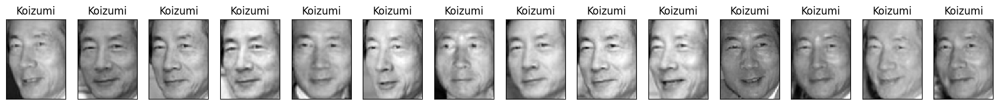

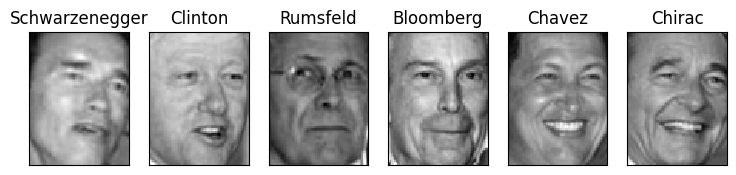

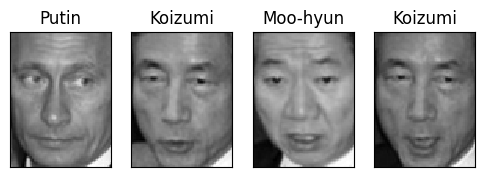

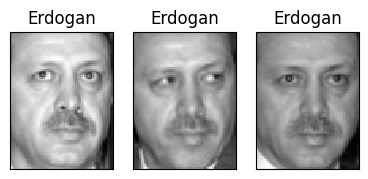

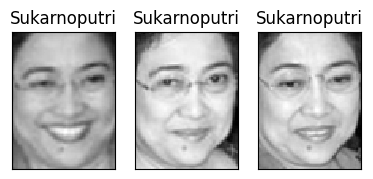

In [97]:
dbscan = DBSCAN(min_samples=3, eps=7)
labels = dbscan.fit_predict(X_pca)

for cluster in range(max(labels) + 1):
    mask = labels == cluster
    n_images = np.sum(mask)
    fig, axes = plt.subplots(1, n_images, figsize=(n_images * 1.5, 4),
                             subplot_kw={'xticks': (), 'yticks': ()})

    if n_images == 1:
        axes = [axes]

    for image, label, ax in zip(X_people[mask], y_people[mask], axes):
        ax.imshow(image.reshape(image_shape), cmap='gray')
        ax.set_title(people.target_names[label].split()[-1])

plt.show()

Kode ini menjalankan DBSCAN dengan `min_samples=3` dan `eps=7`, kemudian menampilkan gambar-gambar yang termasuk dalam setiap cluster. Nama kelas asli juga ditampilkan sebagai informasi tambahan untuk membantu melihat pola identitas yang terkumpul dalam cluster.

In [87]:
# extract clusters with k-Means
km = KMeans(n_clusters=10, random_state=0)
labels_km = km.fit_predict(X_pca)
print("Cluster sizes k-means: {}".format(np.bincount(labels_km)))

Cluster sizes k-means: [  5 286 190 275 185 493   1 286   2 340]


Kode ini menerapkan k-Means pada data wajah hasil PCA dengan 10 cluster. Setelah proses clustering selesai, jumlah anggota pada setiap cluster ditampilkan menggunakan `np.bincount`.

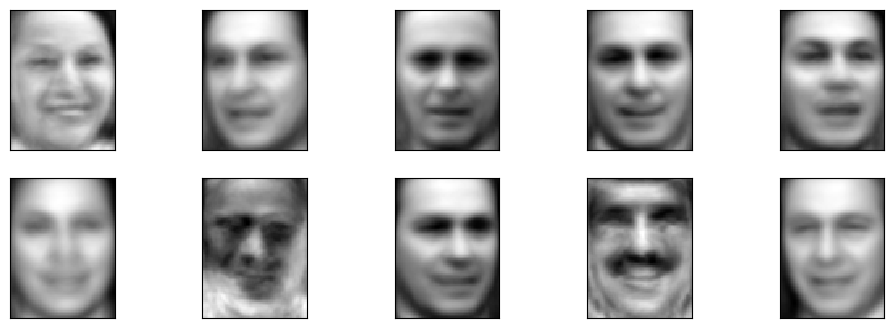

In [98]:
fig, axes = plt.subplots(2, 5, subplot_kw={'xticks': (), 'yticks': ()},
                         figsize=(12, 4))
for center, ax in zip(km.cluster_centers_, axes.ravel()):
    ax.imshow(pca.inverse_transform(center).reshape(image_shape), cmap='gray')

plt.show()

Kode ini menampilkan pusat cluster k-Means dalam bentuk gambar. Karena pusat cluster berada pada ruang PCA, `inverse_transform` digunakan untuk mengembalikannya ke ruang fitur gambar agar hasilnya dapat divisualisasikan sebagai wajah atau pola gambar.

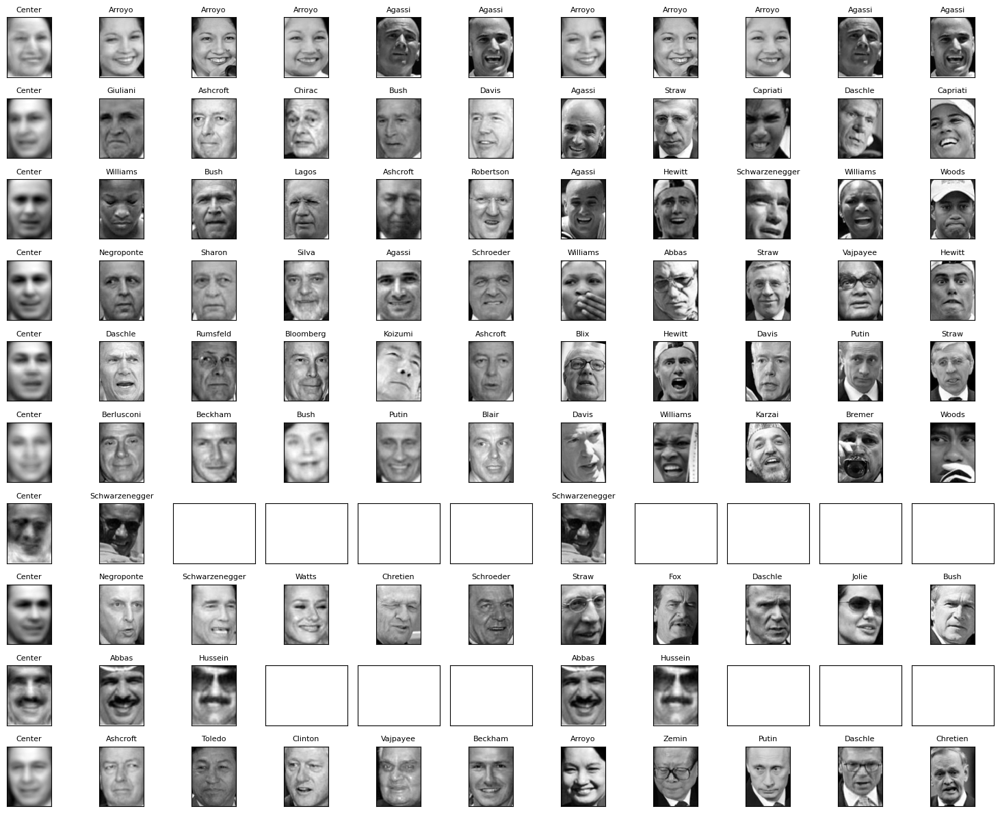

In [99]:
import numpy as np
import matplotlib.pyplot as plt

# Hitung jarak tiap titik ke center cluster
image_shape = people.images[0].shape
fig, axes = plt.subplots(10, 11, figsize=(15, 12),
                         subplot_kw={'xticks': (), 'yticks': ()})

for i, cluster_center in enumerate(km.cluster_centers_):
    # Tampilkan center dari cluster
    axes[i, 0].imshow(pca.inverse_transform(cluster_center).reshape(image_shape), cmap='gray')
    axes[i, 0].set_title("Center", fontsize=8)

    # Cari gambar terdekat dan terjauh dari center
    mask = labels_km == i
    if np.sum(mask) == 0:
        continue
    distances = np.linalg.norm(X_pca[mask] - cluster_center, axis=1)

    # 5 gambar terdekat
    close = np.argsort(distances)[:5]
    for j, index in enumerate(close):
        axes[i, j + 1].imshow(X_people[mask][index].reshape(image_shape), cmap='gray')
        axes[i, j + 1].set_title(people.target_names[y_people[mask][index]].split()[-1], fontsize=8)

    # 5 gambar terjauh
    far = np.argsort(distances)[-5:]
    for j, index in enumerate(far):
        axes[i, j + 6].imshow(X_people[mask][index].reshape(image_shape), cmap='gray')
        axes[i, j + 6].set_title(people.target_names[y_people[mask][index]].split()[-1], fontsize=8)

plt.tight_layout()
plt.show()

Kode ini menghitung jarak setiap gambar terhadap pusat cluster k-Means. Untuk setiap cluster, ditampilkan pusat cluster, lima gambar yang paling dekat, dan lima gambar yang paling jauh sehingga dapat dibandingkan contoh data yang paling mewakili dan yang paling berbeda dari pusat cluster.

In [90]:
# extract clusters with ward agglomerative clustering
agglomerative = AgglomerativeClustering(n_clusters=10)
labels_agg = agglomerative.fit_predict(X_pca)
print("cluster sizes agglomerative clustering: {}".format(
       np.bincount(labels_agg)))

cluster sizes agglomerative clustering: [264 100 275 553  49  64 546  52  51 109]


Kode ini menerapkan agglomerative clustering dengan 10 cluster pada data wajah yang telah direduksi menggunakan PCA. Ukuran setiap cluster kemudian ditampilkan untuk melihat bagaimana data terbagi ke dalam kelompok-kelompok tersebut.

In [91]:
print("ARI: {:.2f}".format(adjusted_rand_score(labels_agg, labels_km)))

ARI: 0.09


Kode ini menghitung Adjusted Rand Index antara hasil clustering agglomerative dan k-Means. Nilai ARI digunakan untuk mengukur seberapa mirip kedua hasil pengelompokan tersebut tanpa mempermasalahkan perbedaan nomor label cluster.

Text(0, 0.5, 'Cluster distance')

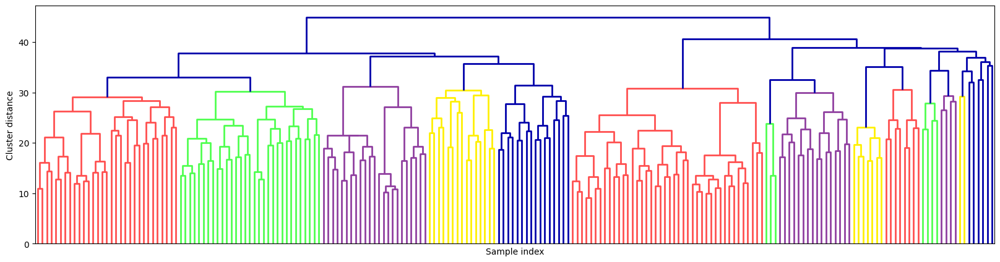

In [92]:
linkage_array = ward(X_pca)
# now we plot the dendrogram for the linkage_array
# containing the distances between clusters
plt.figure(figsize=(20, 5))
dendrogram(linkage_array, p=7, truncate_mode='level', no_labels=True)
plt.xlabel("Sample index")
plt.ylabel("Cluster distance")

Kode ini membuat dendrogram berdasarkan metode Ward pada data PCA. Dendrogram digunakan untuk melihat hubungan hierarkis antar data dan jarak ketika cluster digabungkan, sehingga struktur pengelompokan dapat dianalisis pada beberapa tingkat jumlah cluster.

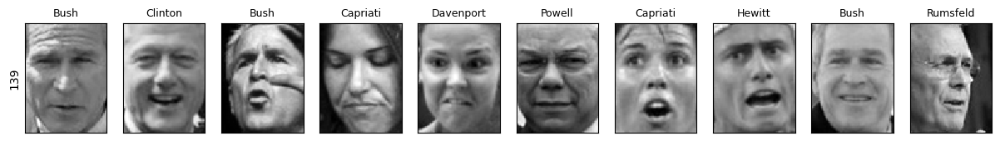

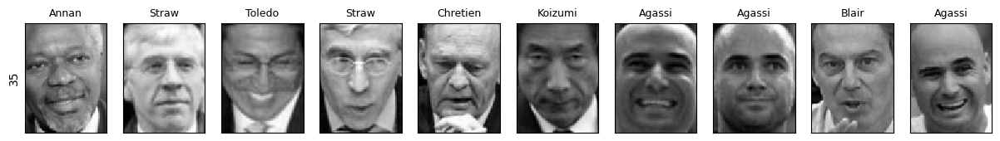

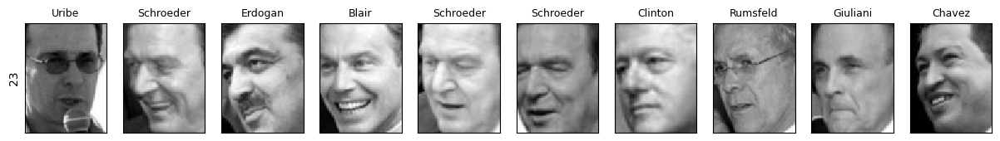

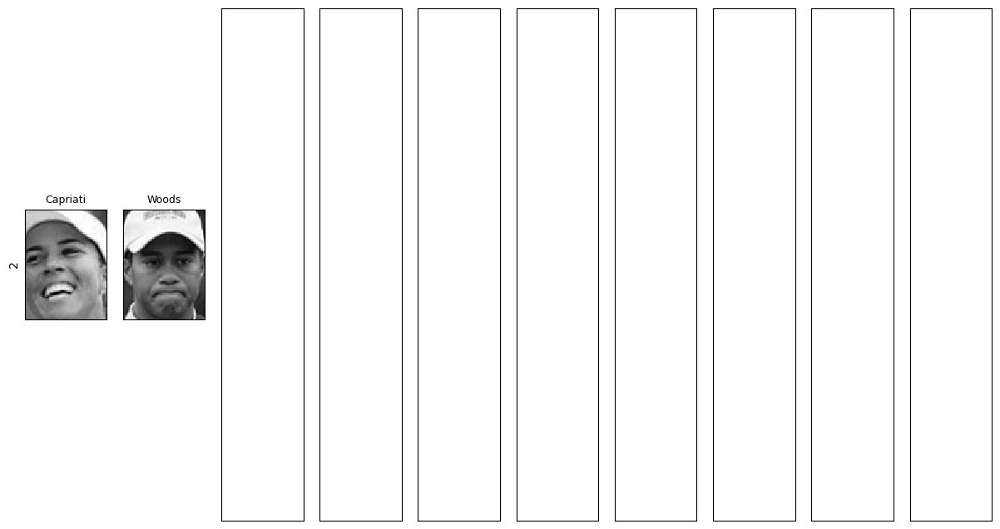

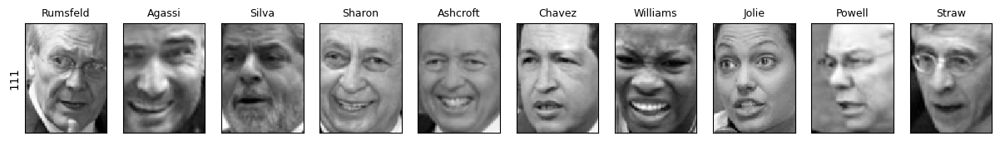

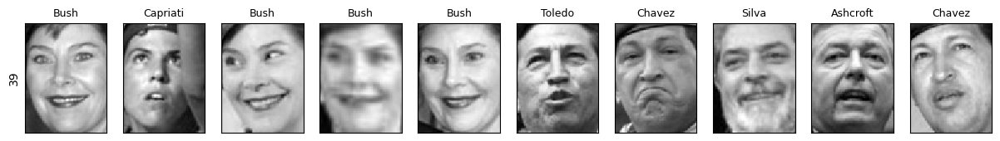

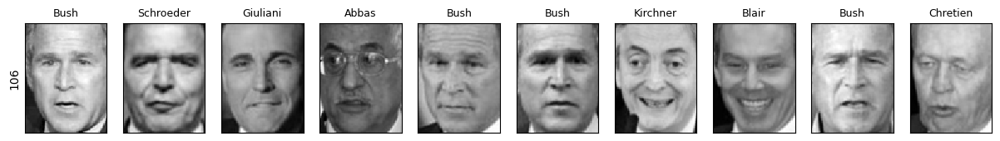

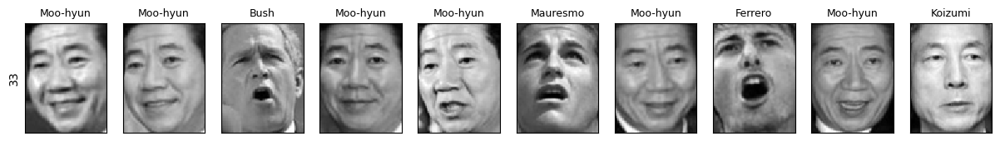

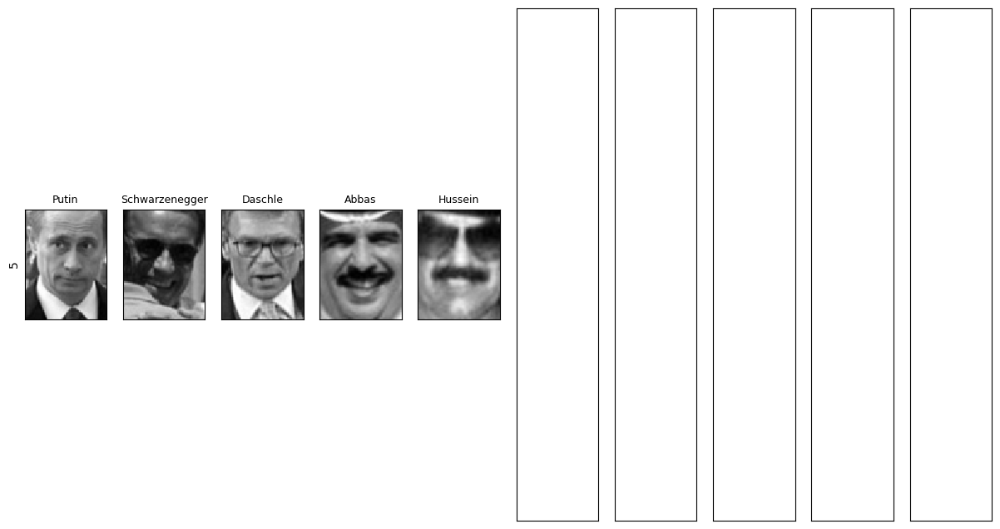

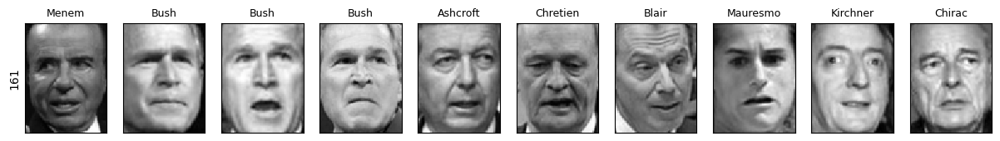

In [100]:
n_clusters = 10
for cluster in range(n_clusters):
    mask = labels_agg == cluster
    fig, axes = plt.subplots(1, 10, subplot_kw={'xticks': (), 'yticks': ()},
                             figsize=(15, 8))

    axes[0].set_ylabel(np.sum(mask))
    for image, label, asdf, ax in zip(X_people[mask], y_people[mask],
                                      labels_agg[mask], axes):
        ax.imshow(image.reshape(image_shape), cmap='gray')
        ax.set_title(people.target_names[label].split()[-1],
                     fontdict={'fontsize': 9})

plt.show()

Kode ini menampilkan gambar-gambar yang masuk ke masing-masing dari 10 cluster hasil agglomerative clustering. Jumlah anggota cluster ditampilkan pada sumbu samping, sedangkan setiap gambar diberi nama kelas aslinya sebagai informasi pembanding.

cluster sizes agglomerative clustering: [139  35  23   2 111  39 106  33   5 161  60  41  70  17  30  20 134  40
  23  38  56 264   4  35  44  16  29 135  25  37  42  34   3  17  31   3
  21  27  76  37]


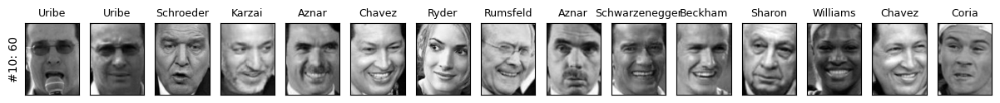

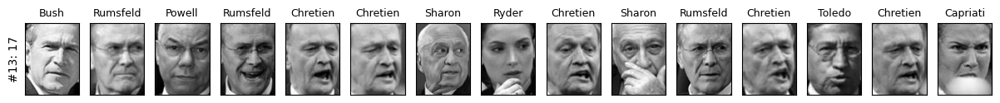

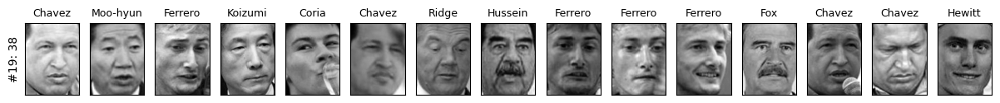

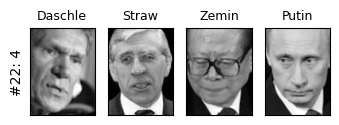

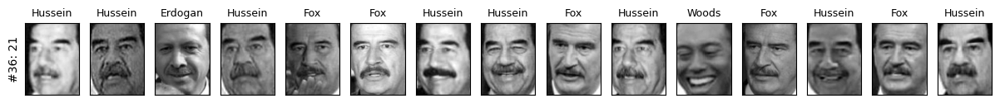

In [102]:
# extract clusters with ward agglomerative clustering
agglomerative = AgglomerativeClustering(n_clusters=40)
labels_agg = agglomerative.fit_predict(X_pca)
print("cluster sizes agglomerative clustering: {}".format(np.bincount(labels_agg)))

n_clusters = 40
for cluster in [10, 13, 19, 22, 36]: # hand-picked "interesting" clusters
    mask = labels_agg == cluster
    fig, axes = plt.subplots(1, 15, subplot_kw={'xticks': (), 'yticks': ()},
                             figsize=(15, 8))

    cluster_size = np.sum(mask)
    axes[0].set_ylabel(f"#{cluster}: {cluster_size}") # Perbaikan penulisan format string
    for image, label, asdf, ax in zip(X_people[mask], y_people[mask],
                                      labels_agg[mask], axes):
        ax.imshow(image.reshape(image_shape), cmap='gray')
        ax.set_title(people.target_names[label].split()[-1],
                     fontdict={'fontsize': 9})
    for i in range(cluster_size, 15):
        axes[i].set_visible(False)

plt.show()

Kode ini mengubah jumlah cluster agglomerative menjadi 40 untuk mendapatkan pengelompokan yang lebih rinci. Beberapa cluster tertentu kemudian dipilih dan ditampilkan untuk melihat pola gambar yang terkumpul pada kelompok-kelompok tersebut.

In [95]:
from sklearn.linear_model import LogisticRegression
logreg = LogisticRegression()

Kode ini membuat objek `LogisticRegression` sebagai model klasifikasi. Pada bagian ini model baru dibuat dan belum dilakukan proses `fit()` maupun evaluasi, sehingga kode berfungsi sebagai tahap awal persiapan model.